In [43]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline
plt.style.use('fivethirtyeight')
import matplotlib
import warnings
warnings.filterwarnings('ignore')
import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import pmdarima as pm

In [44]:
df = pd.read_csv('clima_SC_TNF.csv', sep=',')
df['Fecha'] = pd.to_datetime(df['Fecha'], dayfirst=True)
df.index = df['Fecha']
df.head()

,Fecha,TS,T2M,RH2M,WS10M,T2M_MAX,T2M_MIN,PRECTOTCORR,PRECTOTCORR_SUM
Fecha,,,,,,,,,
1982-01-01,1982-01-01,19.29,17.83,73.19,4.70,22.51,15.44,0.25,0.00
1982-02-01,1982-02-01,19.08,17.16,74.56,5.42,20.63,14.45,0.71,10.55
1982-03-01,1982-03-01,19.37,17.25,78.19,7.16,20.69,15.55,0.12,0.00
1982-04-01,1982-04-01,20.84,17.81,71.44,4.20,21.17,15.44,0.15,0.00
1982-05-01,1982-05-01,21.30,18.76,75.31,6.26,22.61,16.18,0.12,0.00


In [45]:
df.isnull().sum()

Fecha              0
TS                 0
T2M                0
RH2M               0
WS10M              0
T2M_MAX            0
T2M_MIN            0
PRECTOTCORR        0
PRECTOTCORR_SUM    0
dtype: int64

In [46]:
df.dtypes

Fecha              datetime64[ns]
TS                        float64
T2M                       float64
RH2M                      float64
WS10M                     float64
T2M_MAX                   float64
T2M_MIN                   float64
PRECTOTCORR               float64
PRECTOTCORR_SUM           float64
dtype: object

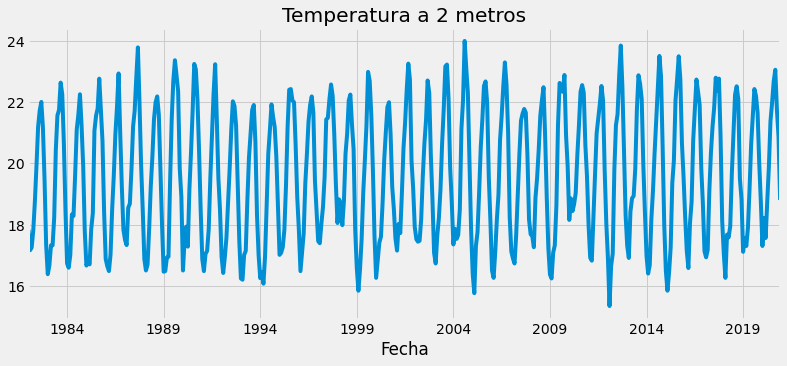

In [47]:
T2Mp = df['T2M']
T2M = T2Mp.dropna()
T2M.plot(figsize=(12,5))
plt.title('Temperatura a 2 metros')
plt.show()

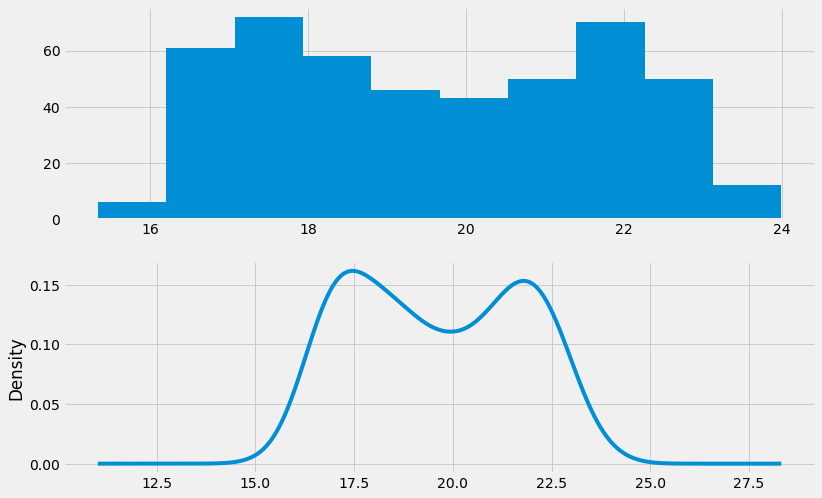

In [48]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, sharex=False, sharey=False, figsize=(12,8))
T2M.hist(ax=ax1)
T2M.plot(kind='kde',ax=ax2)
plt.show()

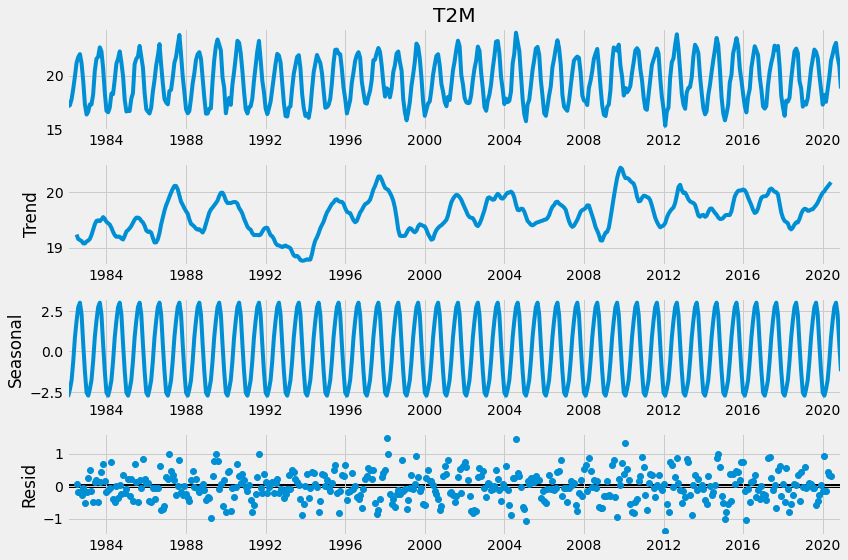

In [49]:
decomposition = seasonal_decompose(T2M, period=12, model='additive')
plt.rcParams['figure.figsize'] = 12, 8
decomposition.plot()
plt.show()

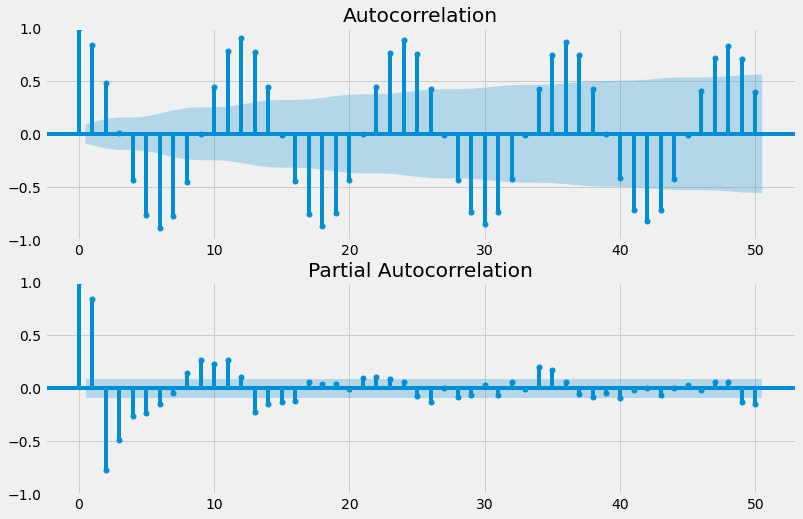

In [50]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12,8), sharex=False, sharey=False)
ax1 = plot_acf(T2M, lags=50, ax=ax1)
ax2 = plot_pacf(T2M, lags=50, ax=ax2)
plt.show()

In [51]:
print ('Results of Dickey-Fuller Test:')
dftest = adfuller(T2M)

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of observation'])
for key, value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)
if dftest[1] <= 0.05:
    print("los datos son estacionarios")
else:
    print("Los datos no son estacionarios")

Results of Dickey-Fuller Test:
Test Statistic            -5.590655
p-value                    0.000001
#Lags Used                15.000000
Number of observation    452.000000
Critical Value (1%)       -3.444900
Critical Value (5%)       -2.867956
Critical Value (10%)      -2.570187
dtype: float64
los datos son estacionarios


In [52]:
model = pm.auto_arima(T2M, d=0, 
                      seasonal=True, m=12, trend='c', 
                      start_p=0, start_q=0, max_order=9, test='adf', 
                      stepwise=True, trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=1015.341, Time=0.79 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2043.633, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=912.663, Time=0.42 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1359.809, Time=0.27 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2043.633, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1472.758, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=inf, Time=1.91 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=727.350, Time=0.72 sec
 ARIMA(1,0,0)(0,0,1)[12] intercept   : AIC=1219.796, Time=0.43 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=747.980, Time=2.82 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=inf, Time=3.25 sec
 ARIMA(1,0,0)(0,0,2)[12] intercept   : AIC=1111.850, Time=1.30 sec
 ARIMA(1,0,0)(2,0,2)[12] intercept   : AIC=inf, Time=3.22 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=866.458, Time=1.16 sec
 ARIMA(1,0,1)(1,0,1)[12] intercept   :

In [53]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                    y   No. Observations:                  468
Model:             SARIMAX(1, 0, 0)x(1, 0, [1], 12)   Log Likelihood                -358.675
Date:                              Thu, 30 Jun 2022   AIC                            727.350
Time:                                      12:23:17   BIC                            748.092
Sample:                                           0   HQIC                           735.512
                                              - 468                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0846      0.040      2.130      0.033       0.007       0.162
ar.L1          0.5708      0.036     15.815      0.000       0.500       0.641
ar.S.L12       0.9898      0.005    206.272      0.000       0.980       0.999
ma.S.L12      -0.7842      0.043    -18.088      0.000      -0.869      -0.699
sigma2         0.2533      0.018     14.157      0.000       0.218       0.288
===================================================================================
Ljung-Box (L1) (Q):                   2.37   Jarque-Bera (JB):                 2.92
Prob(Q):                              0.12   Prob(JB):                         0.23
Heteroskedasticity (H):               1.17   Skew:                             0.18
Prob(H) (two-sided):                  0.33   Kurtosis:                         2.85
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [54]:
model = SARIMAX(T2M,order=(1,0,0),seasonal_order=(1,0,1,12), freq='MS')
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                       
============================================================================================
Dep. Variable:                                  T2M   No. Observations:                  468
Model:             SARIMAX(1, 0, 0)x(1, 0, [1], 12)   Log Likelihood                -393.958
Date:                              Thu, 30 Jun 2022   AIC                            795.916
Time:                                      12:23:18   BIC                            812.510
Sample:                                  01-01-1982   HQIC                           802.446
                                       - 12-01-2020                                         
Covariance Type:                                opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9979      0.002    458.776      0.000       0.994       1.002
ar.S.L12       0.9994      0.001   1491.942      0.000       0.998       1.001
ma.S.L12      -0.9339      0.032    -29.545      0.000      -0.996      -0.872
sigma2         0.2829      0.020     14.457      0.000       0.245       0.321
===================================================================================
Ljung-Box (L1) (Q):                  20.77   Jarque-Bera (JB):                 1.40
Prob(Q):                              0.00   Prob(JB):                         0.50
Heteroskedasticity (H):               1.33   Skew:                             0.13
Prob(H) (two-sided):                  0.08   Kurtosis:                         2.93
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

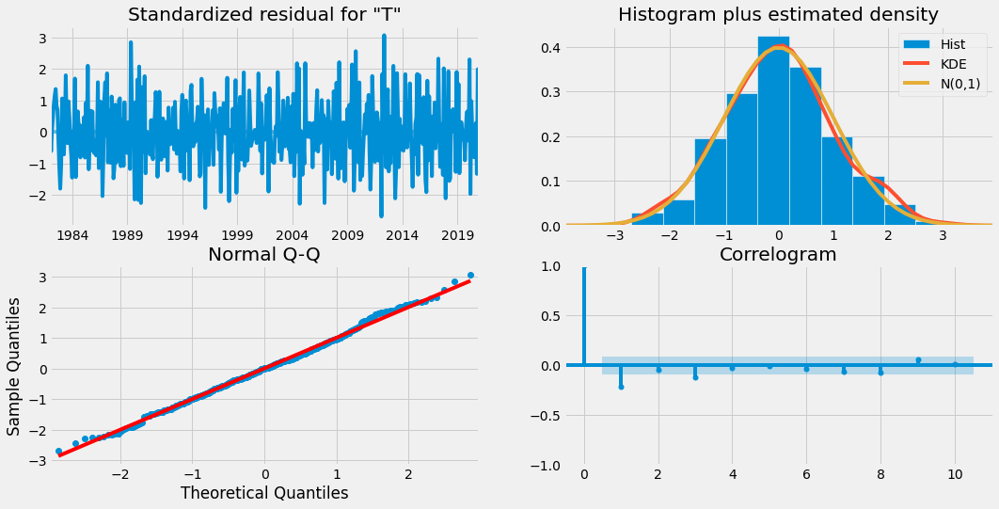

In [55]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

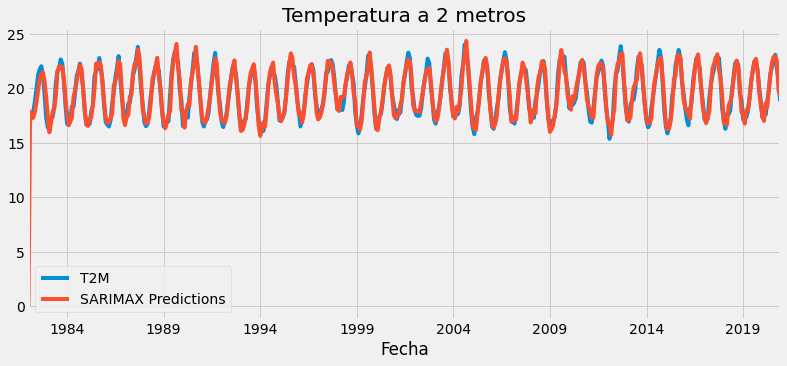

In [56]:
predictions = results.predict(start=0, end=len(T2M)-1, dynamic=False, typ='levels').rename('SARIMAX Predictions')
title = 'Temperatura a 2 metros'
ax = T2M.plot(legend=True,figsize=(12,5),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)

In [58]:
r2_score(T2M, predictions)
evaluation_T2M = pd.DataFrame({'r2_score': r2_score(T2M, predictions)}, index=[0])
evaluation_T2M['mean_absolute_error'] = mean_absolute_error(T2M, predictions)
evaluation_T2M['mean_squared_error'] = mean_squared_error(T2M, predictions)
evaluation_T2M['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - T2M)/np.abs(T2M))*100 
evaluation_T2M

,r2_score,mean_absolute_error,mean_squared_error,mean_absolute_percentage_error
0,0.782272,0.479696,0.995812,2.500793


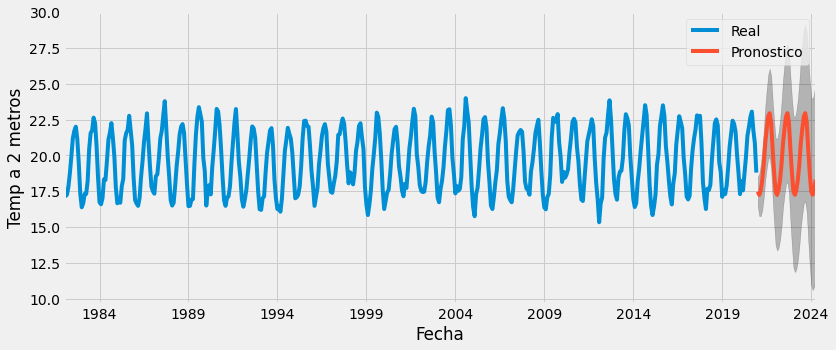

In [59]:
pred_f = results.get_forecast(steps=40)
pred_ci = pred_f.conf_int()
ax = T2M.plot(label='Real', figsize=(12, 5))
pred_f.predicted_mean.plot(ax=ax, label='Pronostico')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Fecha')
ax.set_ylabel('Temp a 2 metros')
plt.legend()
plt.show()

In [60]:
xT2M = pred_f.predicted_mean

In [61]:
xT2M

2021-01-01    17.478963
2021-02-01    17.241275
2021-03-01    17.573953
2021-04-01    18.285721
2021-05-01    19.388632
2021-06-01    20.826965
2021-07-01    21.827654
2021-08-01    22.701718
2021-09-01    22.940092
2021-10-01    22.293866
2021-11-01    20.431537
2021-12-01    18.805196
2022-01-01    17.484945
2022-02-01    17.247370
2022-03-01    17.579807
2022-04-01    18.291097
2022-05-01    19.393287
2022-06-01    20.830691
2022-07-01    21.830724
2022-08-01    22.704210
2022-09-01    22.942401
2022-10-01    22.296542
2022-11-01    20.435338
2022-12-01    18.809973
2023-01-01    17.490509
2023-02-01    17.253048
2023-03-01    17.585244
2023-04-01    18.296059
2023-05-01    19.397529
2023-06-01    20.834006
2023-07-01    21.833383
2023-08-01    22.706292
2023-09-01    22.944301
2023-10-01    22.298811
2023-11-01    20.438730
2023-12-01    18.814343
2024-01-01    17.495667
2024-02-01    17.258320
2024-03-01    17.590276
2024-04-01    18.300615
Freq: MS, Name: predicted_mean, dtype: f

# Predicción de humedad relativa

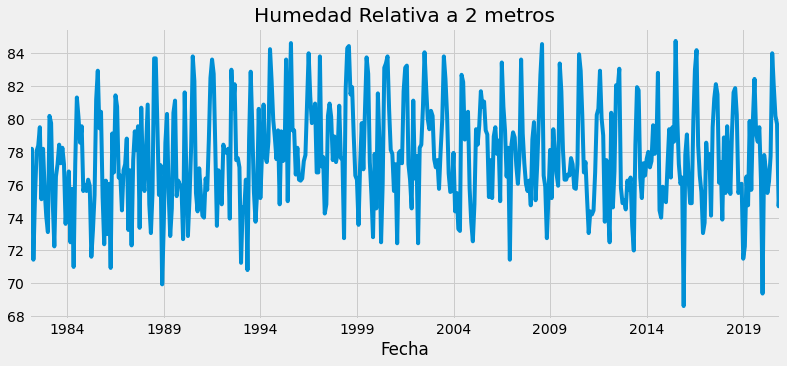

In [62]:
RH2Mp = df['RH2M']
RH2M = RH2Mp.dropna()
RH2M.plot(figsize=(12,5))
plt.title('Humedad Relativa a 2 metros')
plt.show()

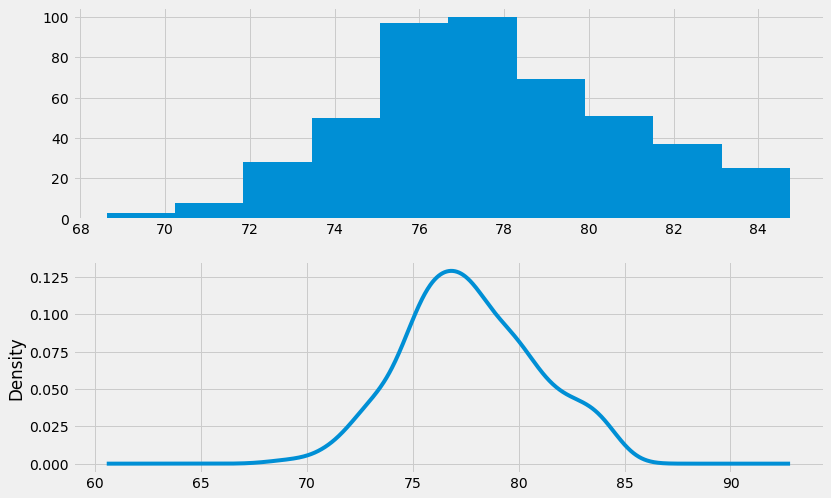

In [63]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, sharex=False, sharey=False, figsize=(12,8))
RH2M.hist(ax=ax1)
RH2M.plot(kind='kde',ax=ax2)
plt.show()

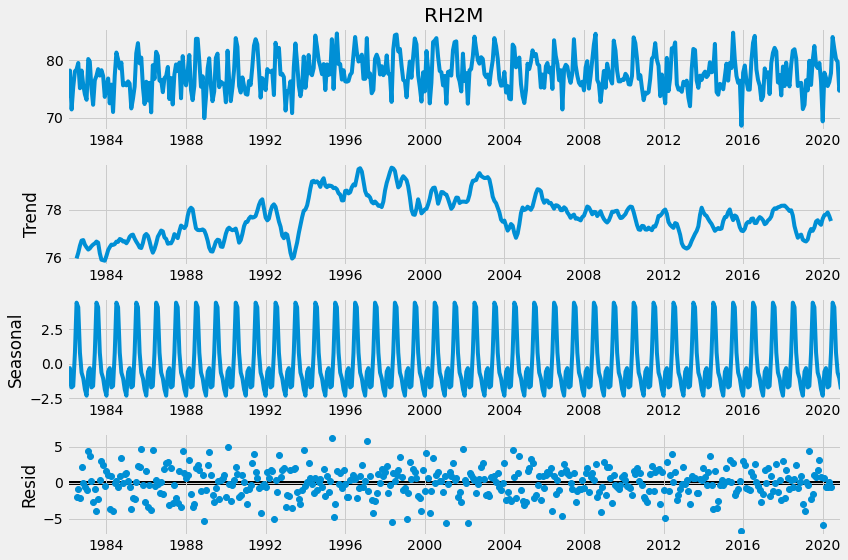

In [64]:
decomposition = seasonal_decompose(RH2M, period=12, model='additive')
plt.rcParams['figure.figsize'] = 12, 8
decomposition.plot()
plt.show()

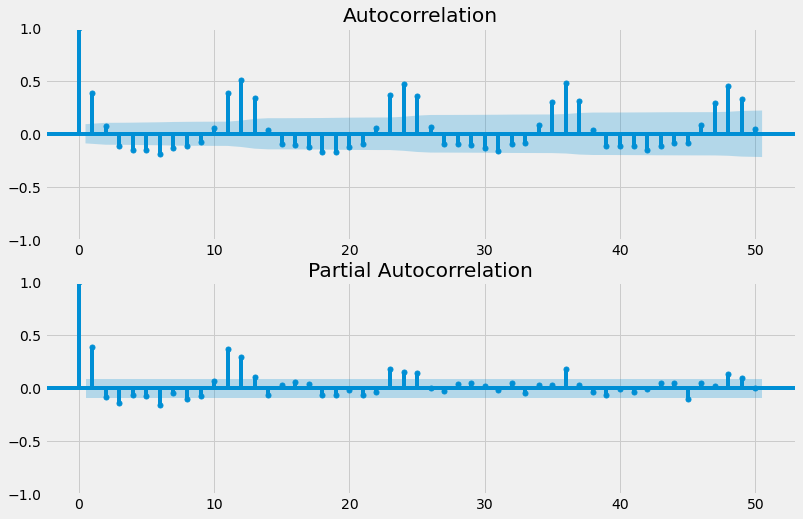

In [65]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12,8), sharex=False, sharey=False)
ax1 = plot_acf(RH2M, lags=50, ax=ax1)
ax2 = plot_pacf(RH2M, lags=50, ax=ax2)
plt.show()

In [66]:
print ('Results of Dickey-Fuller Test:')
dftest = adfuller(RH2M)

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of observation'])
for key, value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)
if dftest[1] <= 0.05:
    print("los datos son estacionarios")
else:
    print("Los datos no son estacionarios")

Results of Dickey-Fuller Test:
Test Statistic            -3.729377
p-value                    0.003718
#Lags Used                13.000000
Number of observation    454.000000
Critical Value (1%)       -3.444836
Critical Value (5%)       -2.867927
Critical Value (10%)      -2.570172
dtype: float64
los datos son estacionarios


In [67]:
model = pm.auto_arima(RH2M, d=0, D=0,
                      seasonal=True, m=12, trend='c', 
                      start_p=0, start_q=0, max_order=9, test='adf', stepwise=True, trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=2244.423, Time=0.77 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=2390.666, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=inf, Time=1.58 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=2271.607, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=2390.666, Time=0.01 sec
 ARIMA(0,0,0)(0,0,1)[12] intercept   : AIC=2304.825, Time=0.18 sec
 ARIMA(0,0,0)(1,0,0)[12] intercept   : AIC=2249.989, Time=0.61 sec
 ARIMA(0,0,0)(2,0,1)[12] intercept   : AIC=2250.247, Time=1.99 sec
 ARIMA(0,0,0)(1,0,2)[12] intercept   : AIC=2223.010, Time=2.25 sec
 ARIMA(0,0,0)(0,0,2)[12] intercept   : AIC=2272.859, Time=0.49 sec
 ARIMA(0,0,0)(2,0,2)[12] intercept   : AIC=2251.741, Time=2.75 sec
 ARIMA(1,0,0)(1,0,2)[12] intercept   : AIC=2237.939, Time=2.30 sec
 ARIMA(0,0,1)(1,0,2)[12] intercept   : AIC=2242.636, Time=3.06 sec
 ARIMA(1,0,1)(1,0,2)[12] intercept   : AIC=2224.987, Time=3.15 sec
 ARIMA(0,0,0)(1,0,2)[12]

In [68]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                   SARIMAX Results                                   
=====================================================================================
Dep. Variable:                             y   No. Observations:                  468
Model:             SARIMAX(1, 0, [1, 2], 12)   Log Likelihood               -1106.505
Date:                       Thu, 30 Jun 2022   AIC                           2223.010
Time:                               12:26:04   BIC                           2243.752
Sample:                                    0   HQIC                          2231.172
                                       - 468                                         
Covariance Type:                         opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     33.4998      7.377      4.541      0.000      19.041      47.958
ar.S.L12       0.5671      0.095      5.963      0.000       0.381       0.754
ma.S.L12      -0.2508      0.108     -2.314      0.021      -0.463      -0.038
ma.S.L24       0.1745      0.055      3.146      0.002       0.066       0.283
sigma2         6.3614      0.439     14.497      0.000       5.501       7.221
===================================================================================
Ljung-Box (L1) (Q):                  11.03   Jarque-Bera (JB):                 6.33
Prob(Q):                              0.00   Prob(JB):                         0.04
Heteroskedasticity (H):               0.81   Skew:                            -0.28
Prob(H) (two-sided):                  0.19   Kurtosis:                         3.07
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [69]:
model = SARIMAX(RH2M,order=(0,0,0),seasonal_order=(1,0,2,12), freq='MS')
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                   SARIMAX Results                                   
=====================================================================================
Dep. Variable:                          RH2M   No. Observations:                  468
Model:             SARIMAX(1, 0, [1, 2], 12)   Log Likelihood               -1110.319
Date:                       Thu, 30 Jun 2022   AIC                           2228.637
Time:                               12:26:07   BIC                           2245.231
Sample:                           01-01-1982   HQIC                          2235.167
                                - 12-01-2020                                         
Covariance Type:                         opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.S.L12       1.0000   3.84e-05    2.6e+04      0.000       1.000       1.000
ma.S.L12      -0.8000      0.030    -26.761      0.000      -0.859      -0.741
ma.S.L24       0.0145      0.006      2.313      0.021       0.002       0.027
sigma2         5.5640      0.353     15.777      0.000       4.873       6.255
===================================================================================
Ljung-Box (L1) (Q):                   6.46   Jarque-Bera (JB):                 5.22
Prob(Q):                              0.01   Prob(JB):                         0.07
Heteroskedasticity (H):               0.69   Skew:                            -0.24
Prob(H) (two-sided):                  0.02   Kurtosis:                         3.19
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

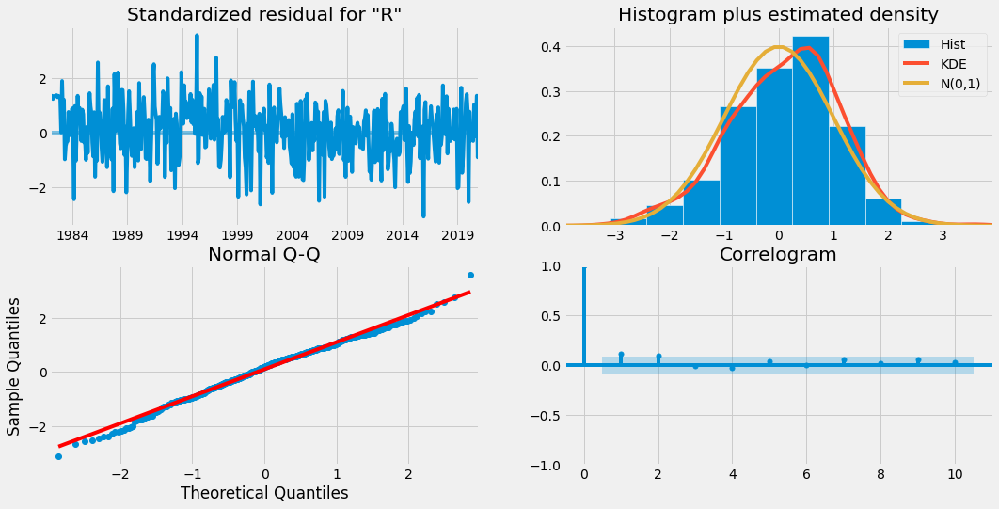

In [70]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

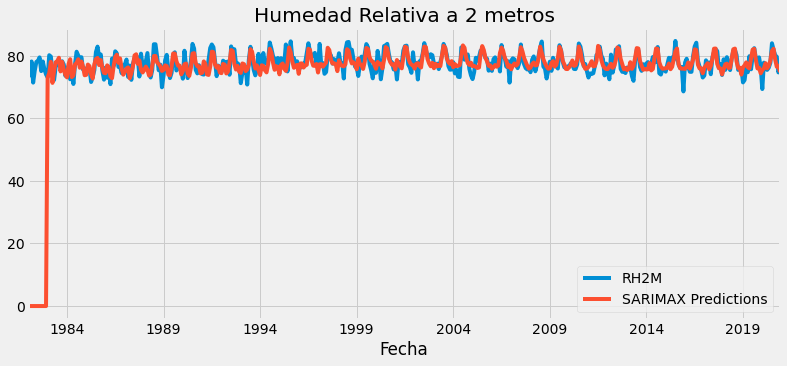

In [71]:
predictions = results.predict(start=0, end=len(RH2M)-1, dynamic=False, typ='levels').rename('SARIMAX Predictions')
title = 'Humedad Relativa a 2 metros'
ax = RH2M.plot(legend=True,figsize=(12,5),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)

In [72]:
r2_score(RH2M, predictions)
evaluation_RH2M = pd.DataFrame({'r2_score': r2_score(RH2M, predictions)}, index=[0])
evaluation_RH2M['mean_absolute_error'] = mean_absolute_error(RH2M, predictions)
evaluation_RH2M['mean_squared_error'] = mean_squared_error(RH2M, predictions)
evaluation_RH2M['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - RH2M)/np.abs(RH2M))*100 
evaluation_RH2M

,r2_score,mean_absolute_error,mean_squared_error,mean_absolute_percentage_error
0,-14.999522,3.793754,153.606562,4.952118


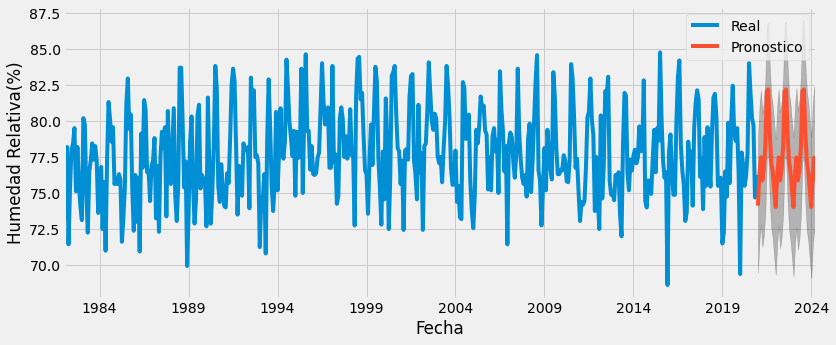

In [73]:
pred_f = results.get_forecast(steps=40)
pred_ci = pred_f.conf_int()
ax = RH2M.plot(label='Real', figsize=(12, 5))
pred_f.predicted_mean.plot(ax=ax, label='Pronostico')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Fecha')
ax.set_ylabel('Humedad Relativa(%)')
plt.legend()
plt.show()

In [74]:
x_RH2M = pred_f.predicted_mean

In [75]:
x_RH2M

2021-01-01    74.120644
2021-02-01    76.285203
2021-03-01    77.479567
2021-04-01    75.886991
2021-05-01    76.690470
2021-06-01    78.273903
2021-07-01    82.019204
2021-08-01    82.191510
2021-09-01    79.086758
2021-10-01    77.164006
2021-11-01    76.445361
2021-12-01    75.121938
2022-01-01    74.030468
2022-02-01    76.308637
2022-03-01    77.466376
2022-04-01    75.876584
2022-05-01    76.679414
2022-06-01    78.260416
2022-07-01    82.051389
2022-08-01    82.183787
2022-09-01    79.103788
2022-10-01    77.207508
2022-11-01    76.411399
2022-12-01    75.139965
2023-01-01    74.027620
2023-02-01    76.305702
2023-03-01    77.463396
2023-04-01    75.873666
2023-05-01    76.676464
2023-06-01    78.257406
2023-07-01    82.048233
2023-08-01    82.180625
2023-09-01    79.100745
2023-10-01    77.204538
2023-11-01    76.408459
2023-12-01    75.137074
2024-01-01    74.024773
2024-02-01    76.302766
2024-03-01    77.460417
2024-04-01    75.870747
Freq: MS, Name: predicted_mean, dtype: f

# Pronóstico de Precipitación

In [76]:
df.head()

,Fecha,TS,T2M,RH2M,WS10M,T2M_MAX,T2M_MIN,PRECTOTCORR,PRECTOTCORR_SUM
Fecha,,,,,,,,,
1982-01-01,1982-01-01,19.29,17.83,73.19,4.70,22.51,15.44,0.25,0.00
1982-02-01,1982-02-01,19.08,17.16,74.56,5.42,20.63,14.45,0.71,10.55
1982-03-01,1982-03-01,19.37,17.25,78.19,7.16,20.69,15.55,0.12,0.00
1982-04-01,1982-04-01,20.84,17.81,71.44,4.20,21.17,15.44,0.15,0.00
1982-05-01,1982-05-01,21.30,18.76,75.31,6.26,22.61,16.18,0.12,0.00


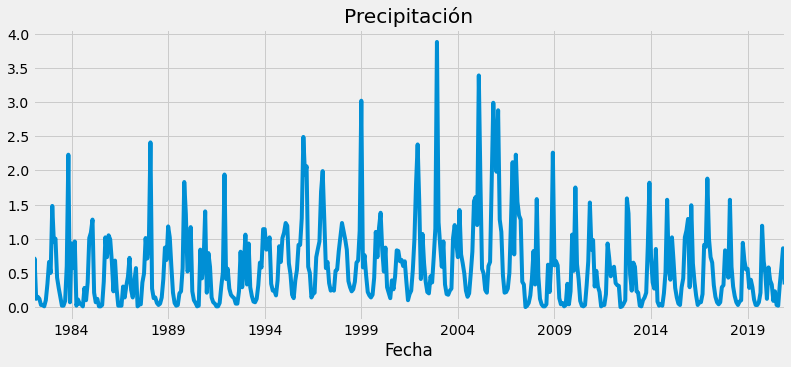

In [77]:
precipp=df['PRECTOTCORR']
precip=precipp.dropna()
precip.plot(figsize=(12,5))
plt.title('Precipitación')
plt.show()

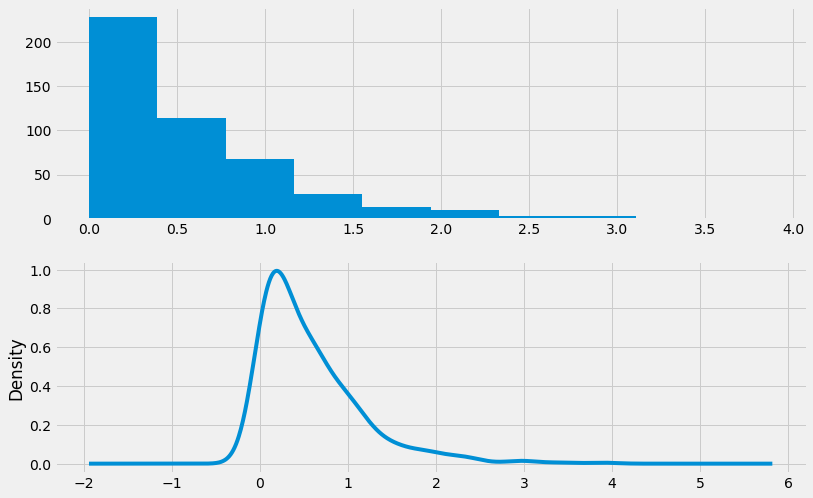

In [78]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, sharex=False, sharey=False, figsize=(12,8))
precip.hist(ax=ax1)
precip.plot(kind='kde',ax=ax2)
plt.show()

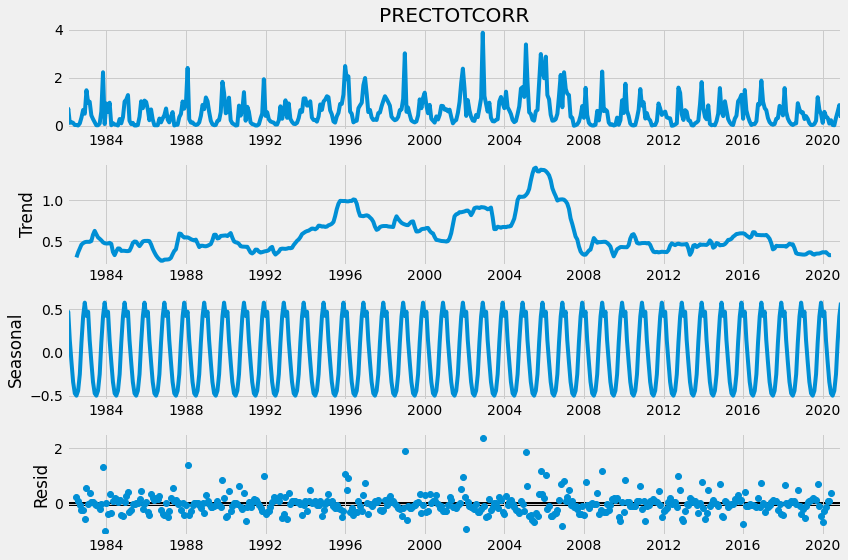

In [79]:
decomposition = seasonal_decompose(precip, period=12, model='additive')
plt.rcParams['figure.figsize'] = 12, 8
decomposition.plot()
plt.show()

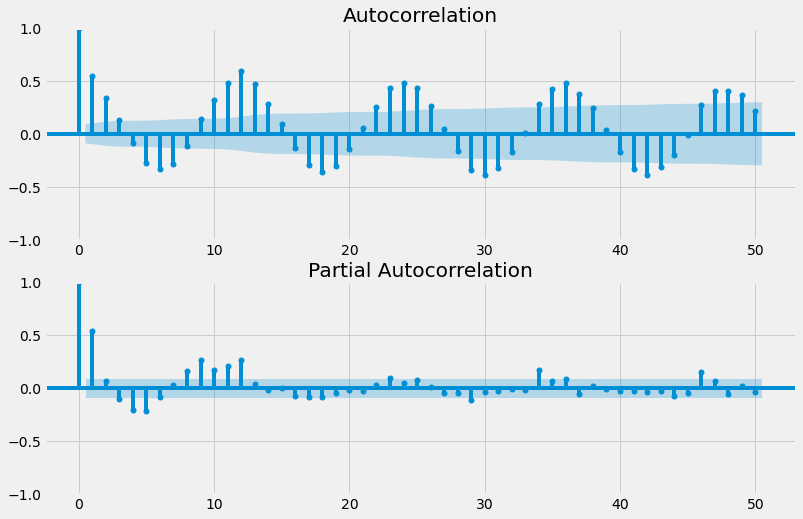

In [80]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12,8), sharex=False, sharey=False)
ax1 = plot_acf(precip, lags=50, ax=ax1)
ax2 = plot_pacf(precip, lags=50, ax=ax2)
plt.show()

In [81]:
print ('Results of Dickey-Fuller Test:')
dftest = adfuller(precip)

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of observation'])
for key, value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)
if dftest[1] <= 0.05:
    print("los datos son estacionarios")
else:
    print("Los datos no son estacionarios")

Results of Dickey-Fuller Test:
Test Statistic            -2.727109
p-value                    0.069464
#Lags Used                11.000000
Number of observation    456.000000
Critical Value (1%)       -3.444772
Critical Value (5%)       -2.867899
Critical Value (10%)      -2.570157
dtype: float64
Los datos no son estacionarios


In [82]:
df_diff = precip.diff().diff(12)
df_diff.dropna(inplace=True)
df_diff.tail()

Fecha
2020-08-01   -0.05
2020-09-01    0.17
2020-10-01   -0.73
2020-11-01    0.80
2020-12-01   -0.35
Name: PRECTOTCORR, dtype: float64

In [83]:
print ('Results of Dickey-Fuller Test:')
dftest = adfuller(df_diff)

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of observation'])
for key, value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)
if dftest[1] <= 0.05:
    print("los datos son estacionarios")
else:
    print("Los datos no son estacionarios")

Results of Dickey-Fuller Test:
Test Statistic          -8.971028e+00
p-value                  7.753209e-15
#Lags Used               1.500000e+01
Number of observation    4.390000e+02
Critical Value (1%)     -3.445334e+00
Critical Value (5%)     -2.868146e+00
Critical Value (10%)    -2.570289e+00
dtype: float64
los datos son estacionarios


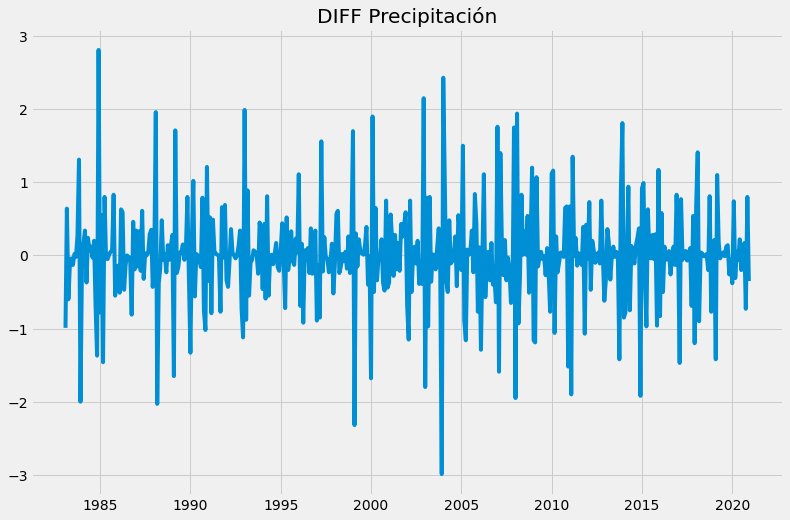

In [84]:
plt.plot(df_diff)
plt.title('DIFF Precipitación')
plt.show()

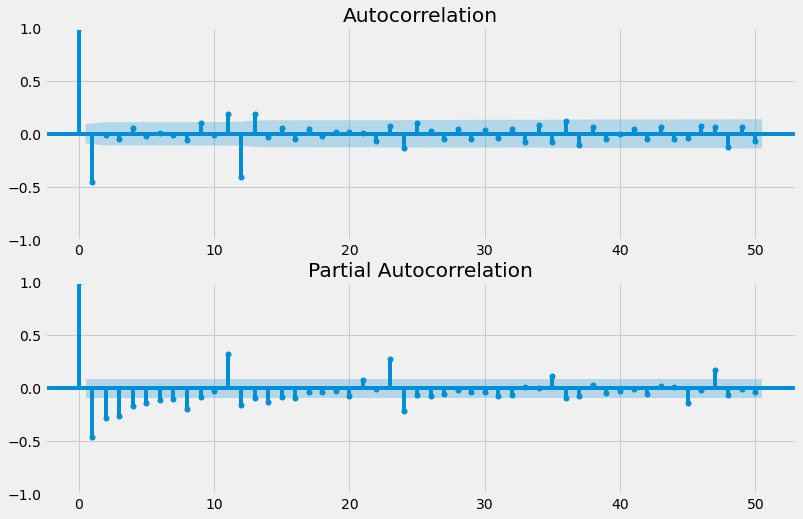

In [85]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12,8), sharex=False, sharey=False)
ax1 = plot_acf(df_diff, lags=50, ax=ax1)
ax2 = plot_pacf(df_diff, lags=50, ax=ax2)
plt.show()

In [86]:
model = pm.auto_arima(precip, d=1, D=1,
                      seasonal=True, m=12, trend='c', 
                      start_p=0, start_q=0, max_order=9, test='adf', stepwise=True, trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(1,1,1)[12]             : AIC=inf, Time=2.23 sec
 ARIMA(0,1,0)(0,1,0)[12]             : AIC=944.943, Time=0.09 sec
 ARIMA(1,1,0)(1,1,0)[12]             : AIC=758.542, Time=0.44 sec
 ARIMA(0,1,1)(0,1,1)[12]             : AIC=inf, Time=1.52 sec
 ARIMA(1,1,0)(0,1,0)[12]             : AIC=839.336, Time=0.22 sec
 ARIMA(1,1,0)(2,1,0)[12]             : AIC=712.494, Time=1.09 sec
 ARIMA(1,1,0)(2,1,1)[12]             : AIC=inf, Time=7.07 sec
 ARIMA(1,1,0)(1,1,1)[12]             : AIC=inf, Time=2.35 sec
 ARIMA(0,1,0)(2,1,0)[12]             : AIC=805.318, Time=0.99 sec
 ARIMA(2,1,0)(2,1,0)[12]             : AIC=657.178, Time=1.79 sec
 ARIMA(2,1,0)(1,1,0)[12]             : AIC=712.364, Time=0.71 sec
 ARIMA(2,1,0)(2,1,1)[12]             : AIC=inf, Time=5.78 sec
 ARIMA(2,1,0)(1,1,1)[12]             : AIC=inf, Time=1.86 sec
 ARIMA(3,1,0)(2,1,0)[12]             : AIC=634.696, Time=2.31 sec
 ARIMA(3,1,0)(1,1,0)[12]             : AIC=689.554, Time=

In [87]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  468
Model:             SARIMAX(1, 1, 2)x(2, 1, [], 12)   Log Likelihood                -283.175
Date:                             Thu, 30 Jun 2022   AIC                            580.351
Time:                                     12:32:48   BIC                            609.193
Sample:                                          0   HQIC                           591.713
                                             - 468                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.0014      0.006     -0.245      0.806      -0.013       0.010
ar.L1         -0.9411      0.026    -36.789      0.000      -0.991      -0.891
ma.L1          0.1112      0.025      4.502      0.000       0.063       0.160
ma.L2         -0.8698      0.022    -40.050      0.000      -0.912      -0.827
ar.S.L12      -0.5362      0.034    -15.986      0.000      -0.602      -0.470
ar.S.L24      -0.3379      0.032    -10.398      0.000      -0.402      -0.274
sigma2         0.1997      0.008     24.756      0.000       0.184       0.215
===================================================================================
Ljung-Box (L1) (Q):                   1.18   Jarque-Bera (JB):               437.58
Prob(Q):                              0.28   Prob(JB):                         0.00
Heteroskedasticity (H):               0.98   Skew:                             0.86
Prob(H) (two-sided):                  0.89   Kurtosis:                         7.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [88]:
model = SARIMAX(precip,order=(1,1,2),seasonal_order=(2,1,0,12))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                         PRECTOTCORR   No. Observations:                  468
Model:             SARIMAX(1, 1, 2)x(2, 1, [], 12)   Log Likelihood                -283.207
Date:                             Thu, 30 Jun 2022   AIC                            578.415
Time:                                     12:32:53   BIC                            603.136
Sample:                                 01-01-1982   HQIC                           588.154
                                      - 12-01-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.9411      0.025    -36.980      0.000      -0.991      -0.891
ma.L1          0.1114      0.024      4.553      0.000       0.063       0.159
ma.L2         -0.8696      0.022    -40.049      0.000      -0.912      -0.827
ar.S.L12      -0.5365      0.033    -16.362      0.000      -0.601      -0.472
ar.S.L24      -0.3377      0.032    -10.483      0.000      -0.401      -0.275
sigma2         0.1998      0.008     25.767      0.000       0.185       0.215
===================================================================================
Ljung-Box (L1) (Q):                   1.15   Jarque-Bera (JB):               438.56
Prob(Q):                              0.28   Prob(JB):                         0.00
Heteroskedasticity (H):               0.98   Skew:                             0.86
Prob(H) (two-sided):                  0.88   Kurtosis:                         7.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

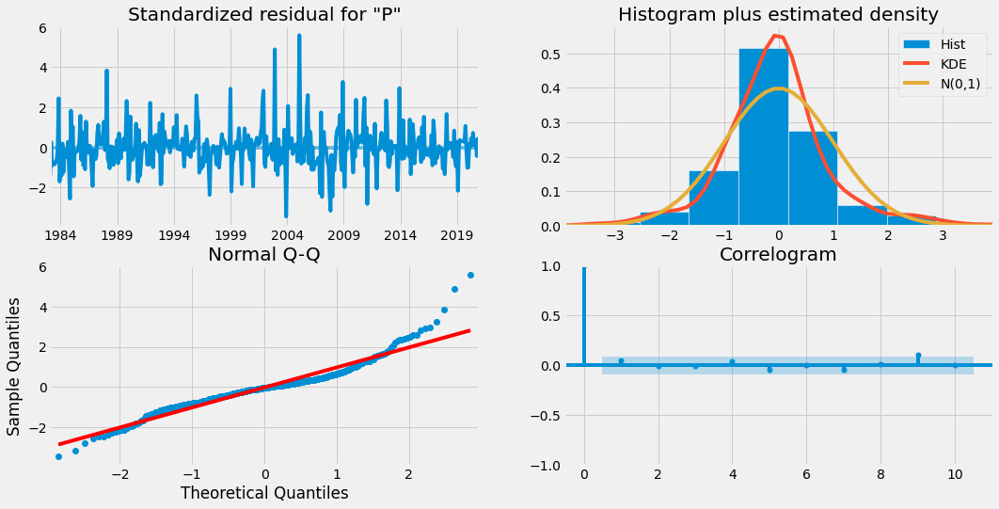

In [89]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

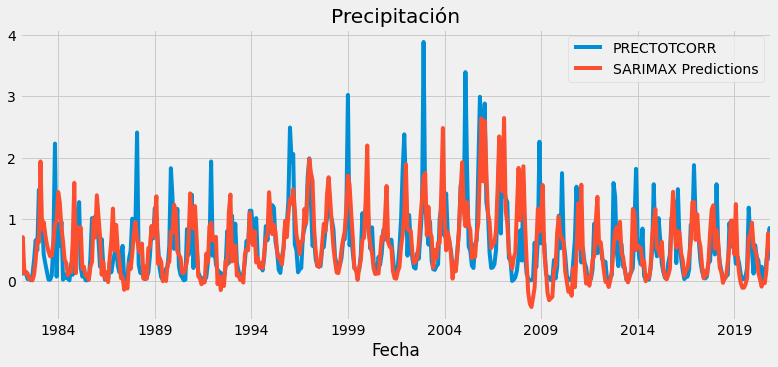

In [90]:
predictions = results.predict(start=0, end=len(precip)-1, dynamic=False, typ='levels').rename('SARIMAX Predictions')
title = 'Precipitación'
ax = precip.plot(legend=True,figsize=(12,5),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)

In [92]:
r2_score(precip, predictions)
evaluation_precip = pd.DataFrame({'r2_score': r2_score(precip, predictions)}, index=[0])
evaluation_precip['mean_absolute_error'] = mean_absolute_error(precip, predictions)
evaluation_precip['mean_squared_error'] = mean_squared_error(precip, predictions)
evaluation_precip['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - precip)/np.abs(precip))*100 
evaluation_precip

,r2_score,mean_absolute_error,mean_squared_error,mean_absolute_percentage_error
0,0.396601,0.306208,0.202778,inf


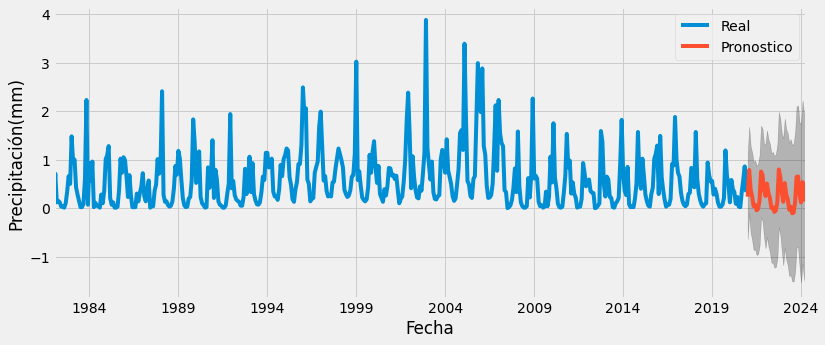

In [93]:
pred_f = results.get_forecast(steps=40)
pred_ci = pred_f.conf_int()
ax = precip.plot(label='Real', figsize=(12, 5))
pred_f.predicted_mean.plot(ax=ax, label='Pronostico')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Fecha')
ax.set_ylabel('Precipitación(mm)')
plt.legend()
plt.show()

# Pronóstico de Viento

In [94]:
df.head()

,Fecha,TS,T2M,RH2M,WS10M,T2M_MAX,T2M_MIN,PRECTOTCORR,PRECTOTCORR_SUM
Fecha,,,,,,,,,
1982-01-01,1982-01-01,19.29,17.83,73.19,4.70,22.51,15.44,0.25,0.00
1982-02-01,1982-02-01,19.08,17.16,74.56,5.42,20.63,14.45,0.71,10.55
1982-03-01,1982-03-01,19.37,17.25,78.19,7.16,20.69,15.55,0.12,0.00
1982-04-01,1982-04-01,20.84,17.81,71.44,4.20,21.17,15.44,0.15,0.00
1982-05-01,1982-05-01,21.30,18.76,75.31,6.26,22.61,16.18,0.12,0.00


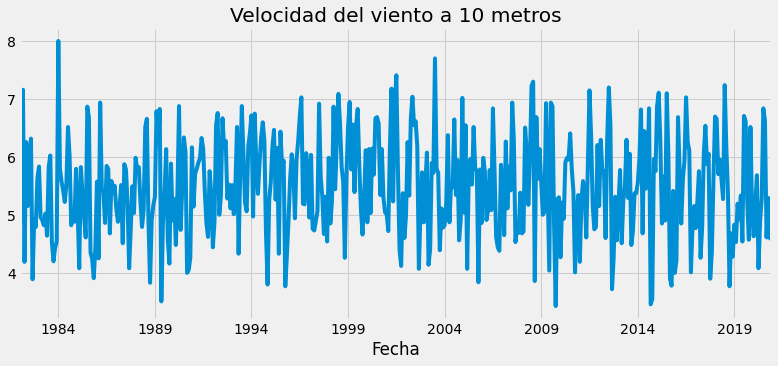

In [95]:
WSp = df['WS10M']
WS = WSp.dropna()
WS.plot(figsize=(12,5))
plt.title('Velocidad del viento a 10 metros')
plt.show()

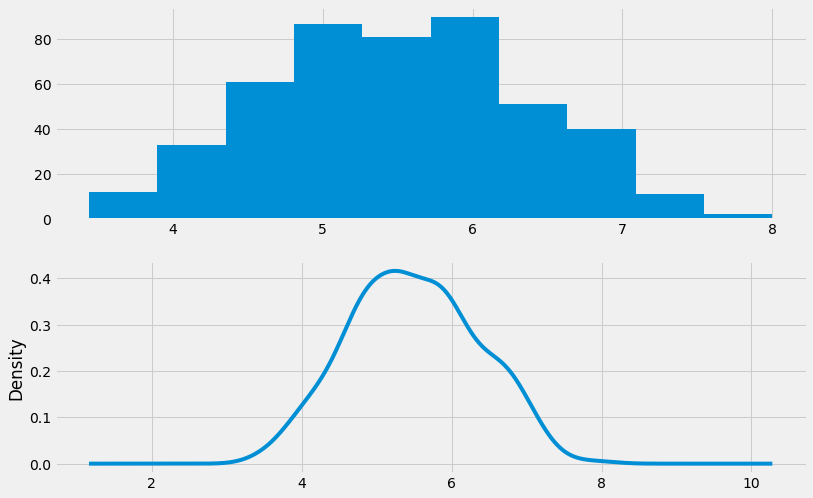

In [96]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, sharex=False, sharey=False, figsize=(12,8))
WS.hist(ax=ax1)
WS.plot(kind='kde',ax=ax2)
plt.show()

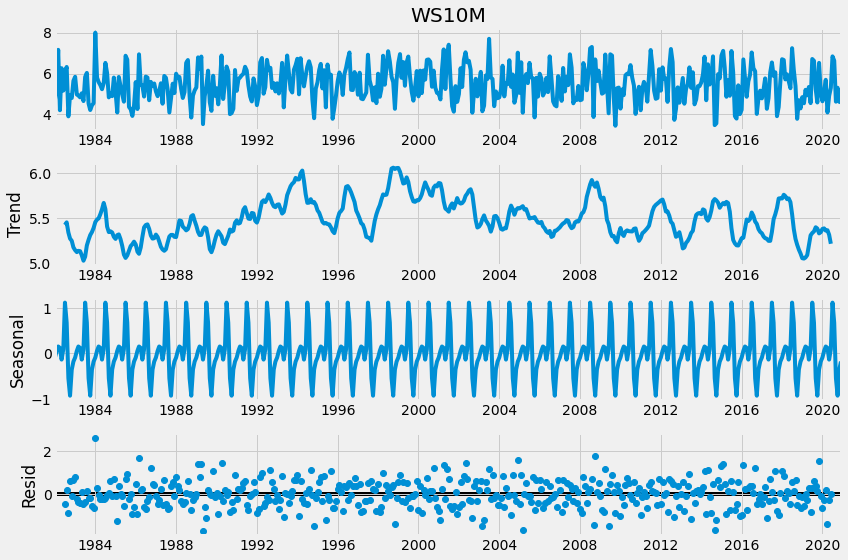

In [97]:
decomposition = seasonal_decompose(WS, period=12, model='additive')
plt.rcParams['figure.figsize'] = 12, 8
decomposition.plot()
plt.show()

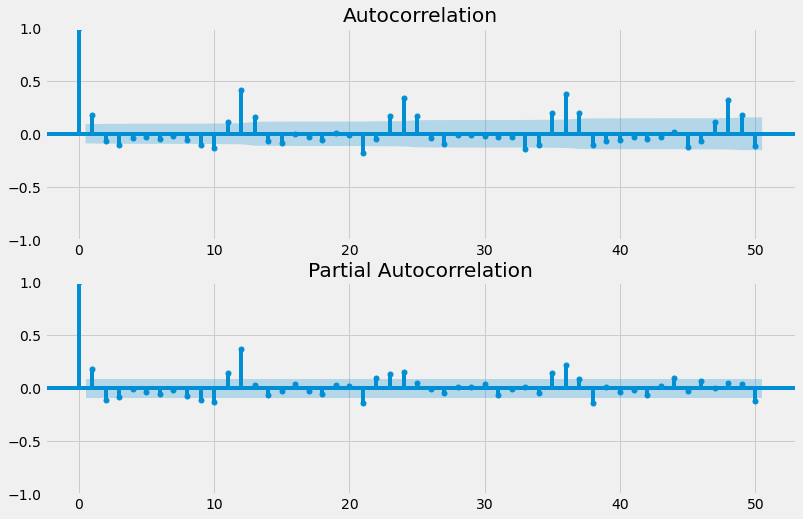

In [98]:
fig, (ax1, ax2) = plt.subplots(nrows=2, ncols=1, figsize=(12,8), sharex=False, sharey=False)
ax1 = plot_acf(WS, lags=50, ax=ax1)
ax2 = plot_pacf(WS, lags=50, ax=ax2)
plt.show()

In [99]:
print ('Results of Dickey-Fuller Test:')
dftest = adfuller(T2M)

dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of observation'])
for key, value in dftest[4].items():
    dfoutput['Critical Value (%s)'%key] = value
print(dfoutput)
if dftest[1] <= 0.05:
    print("los datos son estacionarios")
else:
    print("Los datos no son estacionarios")

Results of Dickey-Fuller Test:
Test Statistic            -5.590655
p-value                    0.000001
#Lags Used                15.000000
Number of observation    452.000000
Critical Value (1%)       -3.444900
Critical Value (5%)       -2.867956
Critical Value (10%)      -2.570187
dtype: float64
los datos son estacionarios


In [100]:
model = pm.auto_arima(WS, d=0, D=0,
                      seasonal=True, m=12, trend='c', 
                      start_p=0, start_q=0, max_order=9, test='adf', stepwise=True, trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.14 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1187.098, Time=0.05 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1093.778, Time=0.79 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=1116.370, Time=0.18 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1187.098, Time=0.06 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1173.638, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1078.724, Time=3.77 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=5.18 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=1.19 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1080.196, Time=2.71 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1080.634, Time=4.06 sec
 ARIMA(1,0,1)(2,0,0)[12] intercept   : AIC=inf, Time=3.70 sec
 ARIMA(0,0,1)(2,0,0)[12] intercept   : AIC=1078.648, Time=3.00 sec
 ARIMA(0,0,1)(1,0,0)[12] intercept   : AIC=1093.850, Time=0.51 sec
 ARIMA(0,0,1)(2,0,1)[12] intercept   : 

In [101]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  468
Model:             SARIMAX(0, 0, 1)x(2, 0, [], 12)   Log Likelihood                -534.324
Date:                             Thu, 30 Jun 2022   AIC                           1078.648
Time:                                     12:33:36   BIC                           1099.391
Sample:                                          0   HQIC                          1086.810
                                             - 468                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      2.5770      0.276      9.341      0.000       2.036       3.118
ma.L1          0.0894      0.048      1.855      0.064      -0.005       0.184
ar.S.L12       0.3320      0.046      7.168      0.000       0.241       0.423
ar.S.L24       0.1970      0.046      4.245      0.000       0.106       0.288
sigma2         0.5705      0.040     14.174      0.000       0.492       0.649
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):                 0.87
Prob(Q):                              0.98   Prob(JB):                         0.65
Heteroskedasticity (H):               1.17   Skew:                             0.05
Prob(H) (two-sided):                  0.32   Kurtosis:                         2.81
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [102]:
model = SARIMAX(WS,order=(0,0,1),seasonal_order=(2,0,0,12))
results = model.fit()
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                               WS10M   No. Observations:                  468
Model:             SARIMAX(0, 0, 1)x(2, 0, [], 12)   Log Likelihood                -596.390
Date:                             Thu, 30 Jun 2022   AIC                           1200.780
Time:                                     12:33:36   BIC                           1217.374
Sample:                                 01-01-1982   HQIC                          1207.310
                                      - 12-01-2020                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.0691      0.048      1.440      0.150      -0.025       0.163
ar.S.L12       0.5633      0.042     13.385      0.000       0.481       0.646
ar.S.L24       0.4272      0.043      9.849      0.000       0.342       0.512
sigma2         0.6790      0.043     15.803      0.000       0.595       0.763
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 0.49
Prob(Q):                              0.90   Prob(JB):                         0.78
Heteroskedasticity (H):               1.16   Skew:                             0.03
Prob(H) (two-sided):                  0.35   Kurtosis:                         3.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

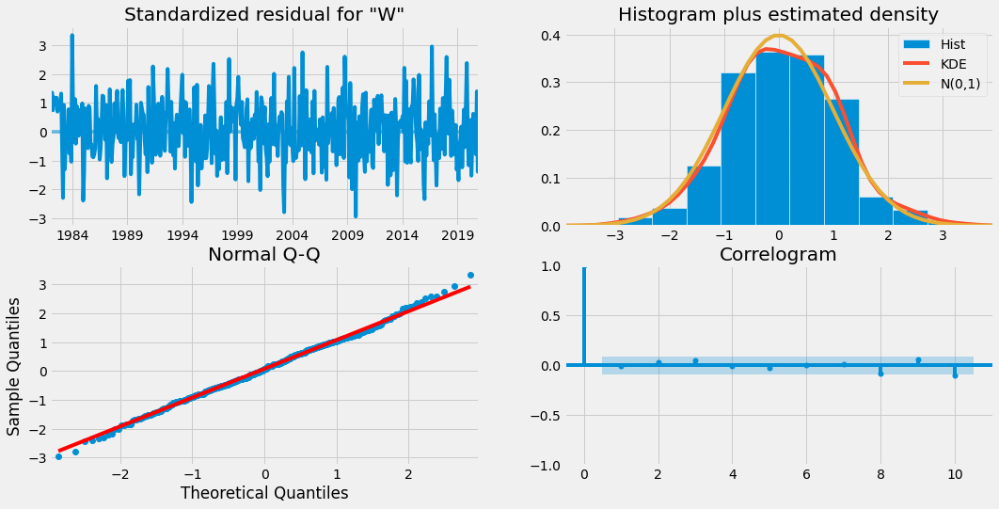

In [103]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

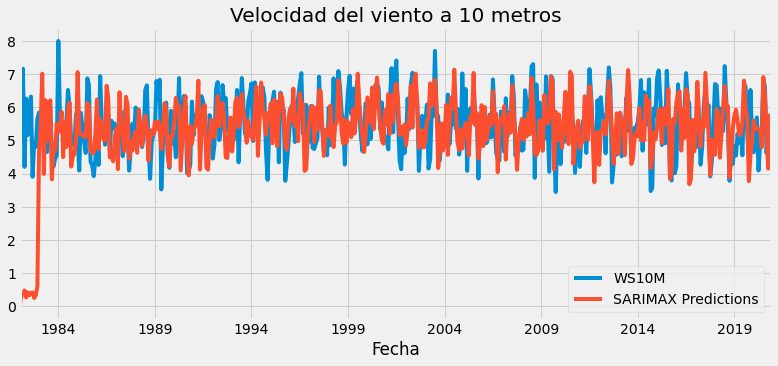

In [104]:
predictions = results.predict(start=0, end=len(WS)-1, dynamic=False, typ='levels').rename('SARIMAX Predictions')
title = 'Velocidad del viento a 10 metros'
ax = WS.plot(legend=True,figsize=(12,5),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)

In [105]:
r2_score(WS, predictions)
evaluation_WS = pd.DataFrame({'r2_score': r2_score(WS, predictions)}, index=[0])
evaluation_WS['mean_absolute_error'] = mean_absolute_error(WS, predictions)
evaluation_WS['mean_squared_error'] = mean_squared_error(WS, predictions)
evaluation_WS['mean_absolute_percentage_error'] = np.mean(np.abs(predictions - WS)/np.abs(WS))*100 
evaluation_WS

,r2_score,mean_absolute_error,mean_squared_error,mean_absolute_percentage_error
0,-0.82227,0.769069,1.336686,14.366919


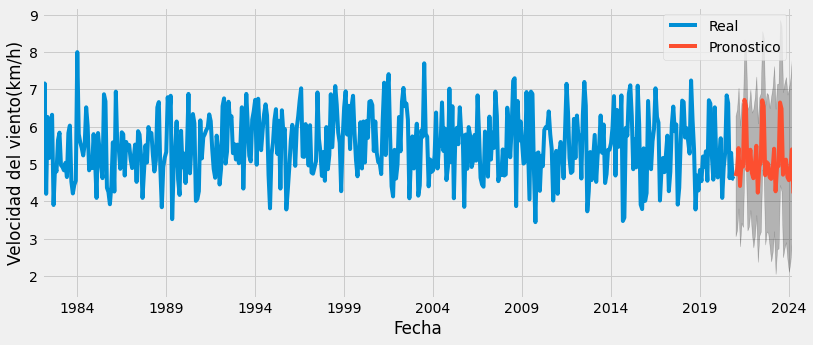

In [106]:
pred_f = results.get_forecast(steps=40)
pred_ci = pred_f.conf_int()
ax = WS.plot(label='Real', figsize=(12, 5))
pred_f.predicted_mean.plot(ax=ax, label='Pronostico')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Fecha')
ax.set_ylabel('Velocidad del viento(km/h)')
plt.legend()
plt.show()

In [119]:
evaluation = pd.concat([evaluation_T2M['r2_score'], evaluation_RH2M['r2_score'], evaluation_WS['r2_score']
                        ,evaluation_precip['r2_score']], axis=1)

In [123]:
evaluation.columns = ['r2_temp', 'r2_humidity', 'r2_wind', 'r2_precip']
evaluation

,r2_temp,r2_humidity,r2_wind,r2_precip
0,0.782272,-14.999522,-0.82227,0.396601


# Pronóstico con Prophet

In [123]:
!pip install fbprophet

     |████████████████████████████████| 64 kB 427 kB/s eta 0:00:011
  Created wheel for fbprophet: filename=fbprophet-0.7.1-py3-none-any.whl size=9537185 sha256=f7c18c579c4dd4c81bb86f644638360809d89a2af7d87fe2246827c68ccc23ae
  Stored in directory: /home/aitor/.cache/pip/wheels/d0/d2/ae/c579b7fd160999d35908f3cb8ebcad7ef64ecaca7b78e4c3c8
Successfully built fbprophet
ERROR: prophet 1.0.1 has requirement cmdstanpy==0.9.68, but you'll have cmdstanpy 0.9.5 which is incompatible.
  Attempting uninstall: cmdstanpy
    Found existing installation: cmdstanpy 0.9.68
    Uninstalling cmdstanpy-0.9.68:
      Successfully uninstalled cmdstanpy-0.9.68


In [127]:
from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot
import plotly.offline as py
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

In [128]:
df_pr = pd.read_csv('clima_SC_TNF.csv', sep=',')
df_pr['Fecha'] = pd.to_datetime(df_pr['Fecha'], dayfirst=True)
df_pr.index = df_pr['Fecha']
df_pr.head()

,Fecha,TS,T2M,RH2M,WS10M,T2M_MAX,T2M_MIN,PRECTOTCORR,PRECTOTCORR_SUM
Fecha,,,,,,,,,
1982-01-01,1982-01-01,19.29,17.83,73.19,4.70,22.51,15.44,0.25,0.00
1982-02-01,1982-02-01,19.08,17.16,74.56,5.42,20.63,14.45,0.71,10.55
1982-03-01,1982-03-01,19.37,17.25,78.19,7.16,20.69,15.55,0.12,0.00
1982-04-01,1982-04-01,20.84,17.81,71.44,4.20,21.17,15.44,0.15,0.00
1982-05-01,1982-05-01,21.30,18.76,75.31,6.26,22.61,16.18,0.12,0.00


In [129]:
temp = df_pr[['Fecha','T2M']]
temp.columns = (['ds','y'])
temp['ds'] = pd.to_datetime(temp['ds'],dayfirst=True)
temp.tail()

,ds,y
Fecha,,
2020-08-01,2020-08-01,22.67
2020-09-01,2020-09-01,23.05
2020-10-01,2020-10-01,21.74
2020-11-01,2020-11-01,20.87
2020-12-01,2020-12-01,18.80


In [130]:
temp.dtypes

ds    datetime64[ns]
y            float64
dtype: object

In [131]:
pron_temp = Prophet(seasonality_mode='additive')
pron_temp.fit(temp)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -4.53924


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1517.7   4.04798e-05       79.4665      0.4812      0.4812      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       1517.75   0.000317351       110.001    3.78e-06       0.001      207  LS failed, Hessian reset 
     199       1517.78   1.37549e-06       50.6954      0.4029      0.4029      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       1517.78   1.08752e-05       63.7217   2.485e-07       0.001      371  LS failed, Hessian reset 
     299       1517.79   1.57007e-07       71.7723      0.4437           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     304       1517.79   3.58714e-07       80.3984      0.7445      0.7445      473   
Optimization terminated normally: 
  Convergence detected: rel

In [132]:
future = pron_temp.make_future_dataframe(periods=30, freq='MS')
future = future.merge(temp, on='ds')
fcst_temp = pron_temp.predict(future)
py.init_notebook_mode()
fig=plot_plotly(pron_temp, fcst_temp)
py.iplot(fig)

In [133]:
fcst_temp[['ds', 'yhat_lower','yhat_upper', 'yhat']]

,ds,yhat_lower,yhat_upper,yhat
0,1982-01-01,16.174345,17.609032,16.854569
1,1982-02-01,15.886836,17.393170,16.668829
2,1982-03-01,16.286433,17.816213,17.049575
3,1982-04-01,16.914848,18.372420,17.605974
4,1982-05-01,18.015465,19.542732,18.766308
...,...,...,...,...
463,2020-08-01,21.847287,23.332041,22.613618
464,2020-09-01,22.053800,23.577753,22.833050
465,2020-10-01,21.422596,22.860416,22.117183
466,2020-11-01,19.573732,20.983946,20.267320


In [134]:
future

,ds,y
0,1982-01-01,17.83
1,1982-02-01,17.16
2,1982-03-01,17.25
3,1982-04-01,17.81
4,1982-05-01,18.76
...,...,...
463,2020-08-01,22.67
464,2020-09-01,23.05
465,2020-10-01,21.74
466,2020-11-01,20.87


In [135]:
predic = fcst_temp['yhat']
y = temp['y']

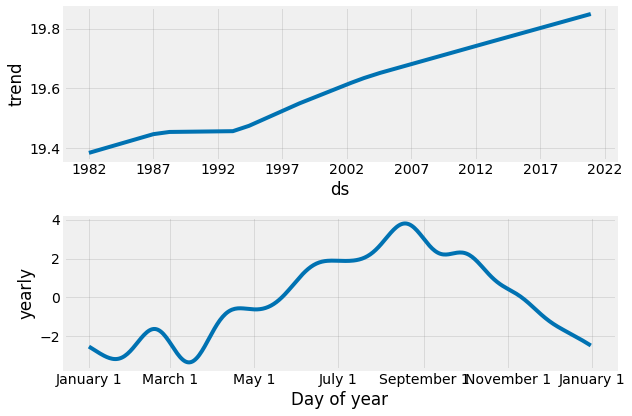

In [136]:
fig=pron_temp.plot_components(fcst_temp)

In [137]:
validacion_T2M = pd.DataFrame({'r2_score': r2_score(y,predic),
                        'MAE': mean_absolute_error(y,predic),
                        'MSE': mean_squared_error(y, predic),
                        'RMSE': mean_squared_error(y,predic, squared=False)}, index=[0])
validacion_T2M.head()

,r2_score,MAE,MSE,RMSE
0,0.929817,0.447875,0.320995,0.566564


In [138]:
futuro = list()
for i in range(1,13):
    fecha = '2021-%02d'%i
    futuro.append([fecha])
futuro = pd.DataFrame(futuro)
futuro.columns = ['ds']
futuro['ds'] = pd.to_datetime(futuro['ds'])
futuro.head()

,ds
0,2021-01-01
1,2021-02-01
2,2021-03-01
3,2021-04-01
4,2021-05-01


In [139]:
model = Prophet()
model.fit(temp)
forecast = model.predict(futuro)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -4.53924
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99        1517.7   4.04798e-05       79.4665      0.4812      0.4812      139   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     129       1517.75   0.000317351       110.001    3.78e-06       0.001      207  LS failed, Hessian reset 
     199       1517.78   1.37549e-06       50.6954      0.4029      0.4029      305   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     226       1517.78   1.08752e-05       63.7217   2.485e-07       0.001      371  LS failed, Hessian reset 
     299       1517.79   1.57007e-07       71.7723      0.4437           1      468   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     304       1517.79   3.58714e-07       80.3984      0.7445      0.7445      473   
Optimization terminat

In [140]:
forecast[['ds', 'yhat']]

,ds,yhat
0,2021-01-01,17.308788
1,2021-02-01,17.153826
2,2021-03-01,17.488269
3,2021-04-01,18.102949
4,2021-05-01,19.230984
5,2021-06-01,20.735269
6,2021-07-01,21.741472
7,2021-08-01,22.605181
8,2021-09-01,22.867651
9,2021-10-01,22.134879


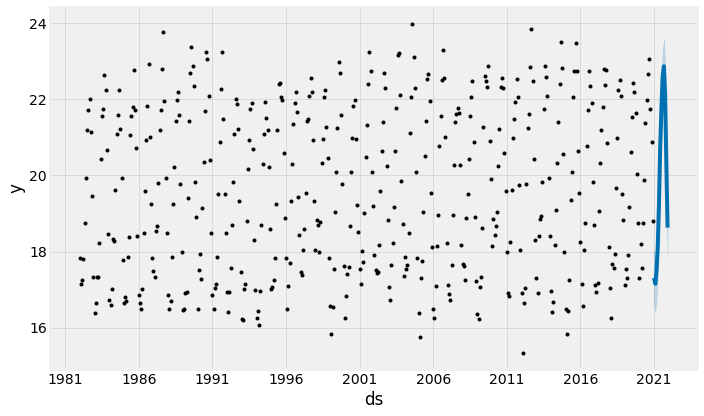

In [141]:
model.plot(forecast)
fig=plot_plotly(pron_temp, forecast)
py.iplot(fig)

# Pronośotico de humedad relativa con Prophet

In [204]:
hum = df_pr[['Fecha','RH2M']]
hum.columns = (['ds','y'])
hum['ds'] = pd.to_datetime(hum['ds'],dayfirst=True)
hum.tail()

,ds,y
Fecha,,
2020-08-01,2020-08-01,81.94
2020-09-01,2020-09-01,80.19
2020-10-01,2020-10-01,79.69
2020-11-01,2020-11-01,74.69
2020-12-01,2020-12-01,76.25


In [205]:
hum.dtypes

ds    datetime64[ns]
y            float64
dtype: object

In [206]:
pron_hum = Prophet(seasonality_mode='additive')
pron_hum.fit(hum)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.62774
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 


      99       1491.98   0.000244585       81.7061           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       1492.12    2.3917e-06       89.6779   3.024e-08       0.001      289  LS failed, Hessian reset 
     199       1492.12   8.95341e-08       70.7184      0.1664           1      309   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


In [207]:
future_hum = pron_hum.make_future_dataframe(periods=30, freq='MS')
future_hum = future_hum.merge(hum, on='ds')
fcst_hum = pron_hum.predict(future_hum)
py.init_notebook_mode()
fig=plot_plotly(pron_hum, fcst_hum)
py.iplot(fig)

In [208]:
fcst_hum[['ds', 'yhat_lower','yhat_upper', 'yhat']]

,ds,yhat_lower,yhat_upper,yhat
0,1982-01-01,70.954177,76.363596,73.724538
1,1982-02-01,72.468749,78.152634,75.442871
2,1982-03-01,72.943355,78.304322,75.598673
3,1982-04-01,71.435925,77.126433,74.277846
4,1982-05-01,72.011386,77.443435,74.772768
...,...,...,...,...
463,2020-08-01,78.830763,84.228565,81.630089
464,2020-09-01,75.471327,80.871835,78.179878
465,2020-10-01,74.450589,79.743087,77.013641
466,2020-11-01,73.247877,78.475187,75.896588


In [209]:
future_hum

,ds,y
0,1982-01-01,73.19
1,1982-02-01,74.56
2,1982-03-01,78.19
3,1982-04-01,71.44
4,1982-05-01,75.31
...,...,...
463,2020-08-01,81.94
464,2020-09-01,80.19
465,2020-10-01,79.69
466,2020-11-01,74.69


In [210]:
predic_hum = fcst_hum['yhat']
y_hum = hum['y']

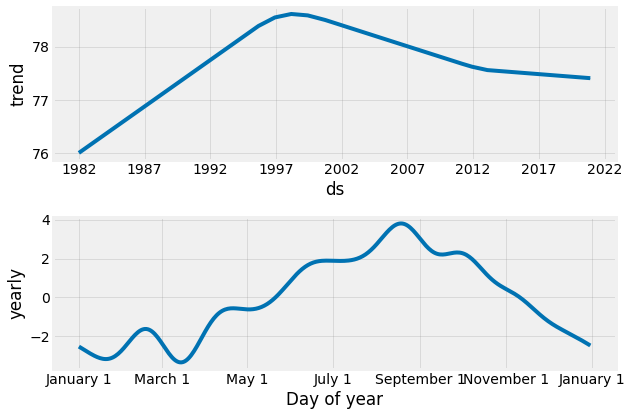

In [211]:
fig=pron_temp.plot_components(fcst_hum)

In [213]:
validacion_RH = pd.DataFrame({'r2_score': r2_score(y_hum,predic_hum),
                        'MAE': mean_absolute_error(y_hum,predic_hum),
                        'MSE': mean_squared_error(y_hum, predic_hum),
                        'RMSE': mean_squared_error(y_hum,predic_hum, squared=False)}, index=[0])
validacion_RH.head()

,r2_score,MAE,MSE,RMSE
0,0.537627,1.664709,4.4391,2.106917


In [214]:
futuro = list()
for i in range(1,13):
    fecha = '2021-%02d'%i
    futuro.append([fecha])
futuro = pd.DataFrame(futuro)
futuro.columns = ['ds']
futuro['ds'] = pd.to_datetime(futuro['ds'])
futuro.head()

,ds
0,2021-01-01
1,2021-02-01
2,2021-03-01
3,2021-04-01
4,2021-05-01


In [216]:
model = Prophet()
model.fit(hum)
forecast_hum = model.predict(futuro)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -2.62774
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1491.98   0.000244585       81.7061           1           1      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     185       1492.12    2.3917e-06       89.6779   3.024e-08       0.001      289  LS failed, Hessian reset 
     199       1492.12   8.95341e-08       70.7184      0.1664           1      309   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


In [217]:
forecast_hum[['ds', 'yhat']]

,ds,yhat
0,2021-01-01,75.249126
1,2021-02-01,76.889779
2,2021-03-01,77.316809
3,2021-04-01,75.546977
4,2021-05-01,75.469238
5,2021-06-01,78.337341
6,2021-07-01,81.988069
7,2021-08-01,81.531153
8,2021-09-01,78.199425
9,2021-10-01,76.864204


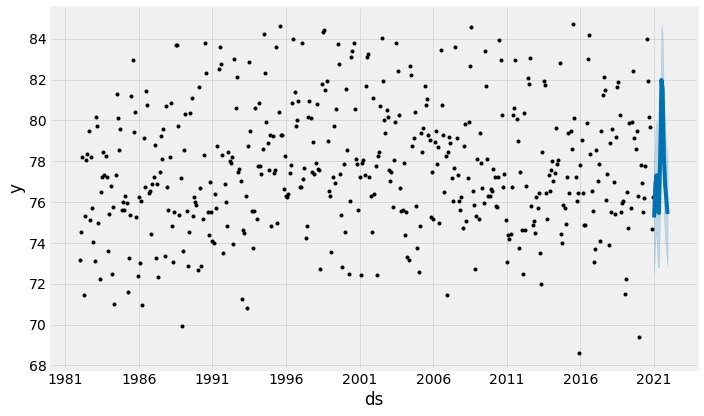

In [219]:
model.plot(forecast_hum)
fig=plot_plotly(pron_hum, forecast_hum)
py.iplot(fig)

# Pronóstico de viento con Prophet

In [220]:
WS = df_pr[['Fecha','WS10M']]
WS.columns = (['ds','y'])
WS['ds'] = pd.to_datetime(WS['ds'],dayfirst=True)
WS.tail()

,ds,y
Fecha,,
2020-08-01,2020-08-01,6.63
2020-09-01,2020-09-01,4.62
2020-10-01,2020-10-01,5.30
2020-11-01,2020-11-01,4.61
2020-12-01,2020-12-01,4.59


In [221]:
WS.dtypes

ds    datetime64[ns]
y            float64
dtype: object

In [222]:
pron_WS = Prophet(seasonality_mode='additive')
pron_WS.fit(WS)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -7.30256


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       920.475   0.000407974       99.5817       2.338      0.5371      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       920.567   0.000774795       117.556   8.006e-06       0.001      176  LS failed, Hessian reset 
     188       920.916   3.13601e-06       88.0524   4.168e-08       0.001      314  LS failed, Hessian reset 
     199       920.916   1.60158e-07       75.6593      0.8514      0.8514      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       920.916   2.92379e-08       67.3745      0.7389      0.7389      339   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


In [226]:
future_WS = pron_WS.make_future_dataframe(periods=30, freq='MS')
future_WS = future_WS.merge(temp, on='ds')
fcst_WS = pron_WS.predict(WS)
py.init_notebook_mode()
fig=plot_plotly(pron_WS, fcst_WS)
py.iplot(fig)

In [227]:
fcst_WS[['ds', 'yhat_lower','yhat_upper', 'yhat']]

,ds,yhat_lower,yhat_upper,yhat
0,1982-01-01,4.267219,5.950169,5.173576
1,1982-02-01,4.433146,6.166753,5.326263
2,1982-03-01,4.581552,6.352055,5.460266
3,1982-04-01,4.400669,6.201522,5.355474
4,1982-05-01,4.343379,6.070972,5.225762
...,...,...,...,...
463,2020-08-01,5.286669,6.954344,6.110332
464,2020-09-01,3.979671,5.639017,4.801988
465,2020-10-01,3.531767,5.318606,4.506958
466,2020-11-01,4.093973,5.768408,4.975072


In [228]:
future_WS

,ds,y
0,1982-01-01,17.83
1,1982-02-01,17.16
2,1982-03-01,17.25
3,1982-04-01,17.81
4,1982-05-01,18.76
...,...,...
463,2020-08-01,22.67
464,2020-09-01,23.05
465,2020-10-01,21.74
466,2020-11-01,20.87


In [233]:
predic_WS = fcst_WS['yhat']
y_WS = WS['y']

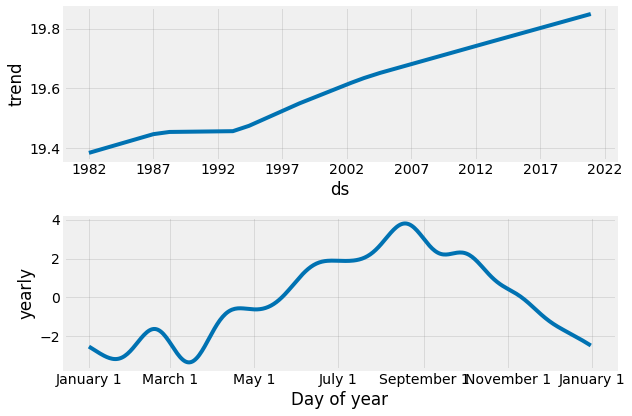

In [234]:
fig=pron_temp.plot_components(fcst_temp)

In [237]:
validacion_WS = pd.DataFrame({'r2_score': r2_score(y_WS,predic_WS),
                        'MAE': mean_absolute_error(y_WS,predic_WS),
                        'MSE': mean_squared_error(y_WS,predic_WS),
                        'RMSE': mean_squared_error(y_WS,predic_WS, squared=False)}, index=[0])
validacion_WS.head()

,r2_score,MAE,MSE,RMSE
0,0.381837,0.535238,0.45344,0.67338


In [238]:
model = Prophet()
model.fit(WS)
forecast_WS = model.predict(futuro)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -7.30256
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       920.475   0.000407974       99.5817       2.338      0.5371      129   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     106       920.567   0.000774795       117.556   8.006e-06       0.001      176  LS failed, Hessian reset 
     188       920.916   3.13601e-06       88.0524   4.168e-08       0.001      314  LS failed, Hessian reset 
     199       920.916   1.60158e-07       75.6593      0.8514      0.8514      328   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     206       920.916   2.92379e-08       67.3745      0.7389      0.7389      339   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance


In [239]:
forecast_WS[['ds', 'yhat']]

,ds,yhat
0,2021-01-01,5.245251
1,2021-02-01,5.368032
2,2021-03-01,5.591053
3,2021-04-01,5.478269
4,2021-05-01,5.214890
5,2021-06-01,5.461347
6,2021-07-01,6.482167
7,2021-08-01,6.071107
8,2021-09-01,4.804537
9,2021-10-01,4.466596


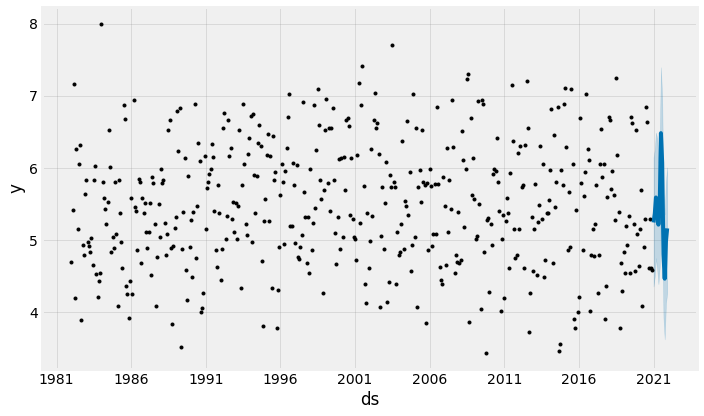

In [241]:
model.plot(forecast_WS)
fig=plot_plotly(pron_WS, forecast_WS)
py.iplot(fig)

# Pronóstico de Precipitación con Prophet

In [242]:
precip = df_pr[['Fecha','PRECTOTCORR']]
precip.columns = (['ds','y'])
precip['ds'] = pd.to_datetime(precip['ds'],dayfirst=True)
precip.tail()

,ds,y
Fecha,,
2020-08-01,2020-08-01,0.02
2020-09-01,2020-09-01,0.33
2020-10-01,2020-10-01,0.58
2020-11-01,2020-11-01,0.86
2020-12-01,2020-12-01,0.33


In [243]:
precip.dtypes

ds    datetime64[ns]
y            float64
dtype: object

In [244]:
pron_precip = Prophet(seasonality_mode='additive')
pron_precip.fit(precip)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.5165


    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       810.792   6.80863e-09       88.6854   0.0001883           1      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


In [246]:
future_precip = pron_precip.make_future_dataframe(periods=30, freq='MS')
future_precip = future_precip.merge(precip, on='ds')
fcst_precip = pron_precip.predict(future_precip)
py.init_notebook_mode()
fig=plot_plotly(pron_precip, fcst_precip)
py.iplot(fig)

In [247]:
future_precip

,ds,y
0,1982-01-01,0.25
1,1982-02-01,0.71
2,1982-03-01,0.12
3,1982-04-01,0.15
4,1982-05-01,0.12
...,...,...
463,2020-08-01,0.02
464,2020-09-01,0.33
465,2020-10-01,0.58
466,2020-11-01,0.86


In [248]:
predic_precip = fcst_precip['yhat']
y_precip = precip['y']

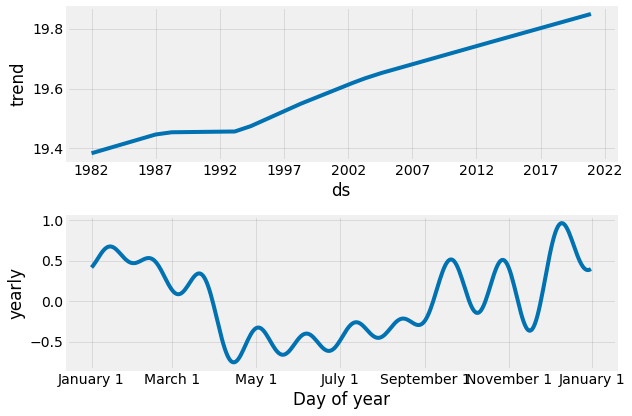

In [249]:
fig=pron_precip.plot_components(fcst_temp)

In [250]:
validacion_precip = pd.DataFrame({'r2_score': r2_score(y_precip,predic_precip),
                        'MAE': mean_absolute_error(y_precip,predic_precip),
                        'MSE': mean_squared_error(y_precip, predic_precip),
                        'RMSE': mean_squared_error(y_precip,predic_precip, squared=False)}, index=[0])
validacion_precip.head()

,r2_score,MAE,MSE,RMSE
0,0.505316,0.263535,0.166243,0.407729


In [251]:
model = Prophet()
model.fit(precip)
forecast_precip = model.predict(futuro)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.5165
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      84       810.792   6.80863e-09       88.6854   0.0001883           1      117   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance


In [252]:
forecast_precip[['ds', 'yhat']]

,ds,yhat
0,2021-01-01,0.748646
1,2021-02-01,0.799222
2,2021-03-01,0.458767
3,2021-04-01,0.204514
4,2021-05-01,-0.010282
5,2021-06-01,-0.142204
6,2021-07-01,-0.172654
7,2021-08-01,-0.121599
8,2021-09-01,0.071613
9,2021-10-01,0.426063


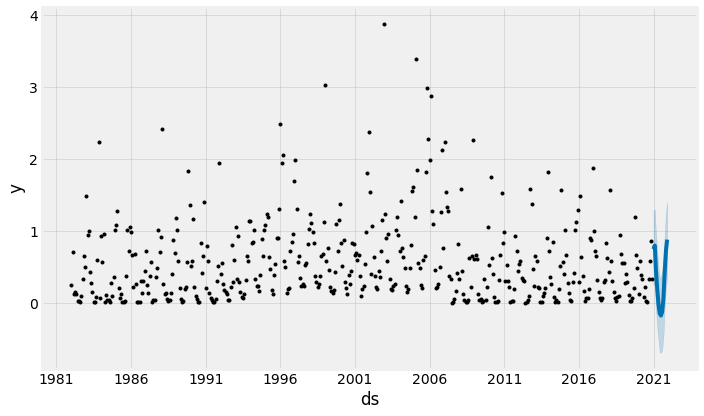

In [260]:
model.plot(forecast_precip)
fig=plot_plotly(pron_precip, forecast_precip)
py.iplot(fig)

In [256]:
validacion = pd.concat([validacion_T2M['r2_score'], validacion_RH['r2_score'], validacion_WS['r2_score']
                        ,validacion_precip['r2_score']], axis=1)

In [257]:
validacion.columns = ['r2_temp', 'r2_humidity', 'r2_wind', 'r2_precip']
validacion

,r2_temp,r2_humidity,r2_wind,r2_precip
0,0.929817,0.537627,0.381837,0.505316


In [ ]:
#fcst.to_csv('prophet_pred_T2M.csv')

# Pronóstico con Random Forest

In [145]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
import time, random

In [146]:
df.head()

,Fecha,TS,T2M,RH2M,WS10M,T2M_MAX,T2M_MIN,PRECTOTCORR,PRECTOTCORR_SUM
Fecha,,,,,,,,,
1982-01-01,1982-01-01,19.29,17.83,73.19,4.70,22.51,15.44,0.25,0.00
1982-02-01,1982-02-01,19.08,17.16,74.56,5.42,20.63,14.45,0.71,10.55
1982-03-01,1982-03-01,19.37,17.25,78.19,7.16,20.69,15.55,0.12,0.00
1982-04-01,1982-04-01,20.84,17.81,71.44,4.20,21.17,15.44,0.15,0.00
1982-05-01,1982-05-01,21.30,18.76,75.31,6.26,22.61,16.18,0.12,0.00


In [147]:
dfrf = df.copy()

In [148]:
dfrf['Año'] = dfrf['Fecha'].apply(lambda x: x.year)
dfrf['Mes'] = dfrf['Fecha'].apply(lambda x: x.month)
dfrf.head()

,Fecha,TS,T2M,RH2M,WS10M,T2M_MAX,T2M_MIN,PRECTOTCORR,PRECTOTCORR_SUM,Año,Mes
Fecha,,,,,,,,,,,
1982-01-01,1982-01-01,19.29,17.83,73.19,4.70,22.51,15.44,0.25,0.00,1982,1
1982-02-01,1982-02-01,19.08,17.16,74.56,5.42,20.63,14.45,0.71,10.55,1982,2
1982-03-01,1982-03-01,19.37,17.25,78.19,7.16,20.69,15.55,0.12,0.00,1982,3
1982-04-01,1982-04-01,20.84,17.81,71.44,4.20,21.17,15.44,0.15,0.00,1982,4
1982-05-01,1982-05-01,21.30,18.76,75.31,6.26,22.61,16.18,0.12,0.00,1982,5


In [149]:
rf = dfrf[['T2M', 'Año', 'Mes']]
rf.head()

,T2M,Año,Mes
Fecha,,,
1982-01-01,17.83,1982,1
1982-02-01,17.16,1982,2
1982-03-01,17.25,1982,3
1982-04-01,17.81,1982,4
1982-05-01,18.76,1982,5


In [150]:
rf['L1'] = rf['T2M'].shift(1)
rf['L2'] = rf['T2M'].shift(2)
rf['L3'] = rf['T2M'].shift(3)
rf['L4'] = rf['T2M'].shift(4)
rf['L5'] = rf['T2M'].shift(5)
rf['L6'] = rf['T2M'].shift(6)
rf['L7'] = rf['T2M'].shift(7)
rf['L8'] = rf['T2M'].shift(8)
rf['L9'] = rf['T2M'].shift(9)
rf['L10'] = rf['T2M'].shift(10)
rf['L11'] = rf['T2M'].shift(11)
rf['L12'] = rf['T2M'].shift(12)

In [151]:
rf.head(15)

,T2M,Año,Mes,L1,L2,L3,L4,L5,L6,L7,L8,L9,L10,L11,L12
Fecha,,,,,,,,,,,,,,,
1982-01-01,17.83,1982,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1982-02-01,17.16,1982,2,17.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1982-03-01,17.25,1982,3,17.16,17.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1982-04-01,17.81,1982,4,17.25,17.16,17.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1982-05-01,18.76,1982,5,17.81,17.25,17.16,17.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1982-06-01,19.93,1982,6,18.76,17.81,17.25,17.16,17.83,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1982-07-01,21.19,1982,7,19.93,18.76,17.81,17.25,17.16,17.83,NaN,NaN,NaN,NaN,NaN,NaN
1982-08-01,21.72,1982,8,21.19,19.93,18.76,17.81,17.25,17.16,17.83,NaN,NaN,NaN,NaN,NaN
1982-09-01,22.00,1982,9,21.72,21.19,19.93,18.76,17.81,17.25,17.16,17.83,NaN,NaN,NaN,NaN


In [152]:
rf = rf.dropna()

In [153]:
X = rf[['Año', 'Mes','L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'L7', 'L8', 'L9', 'L10', 'L11', 'L12']]
y = rf['T2M']

In [154]:
seed=random.seed(time.time())
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=seed, shuffle=False)

In [155]:
model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)
pred = model_rf.predict(X_test)

In [156]:
b = pd.DataFrame({'Actual': y_test, 'Random_Forest': pred})
b.head()

,Actual,Random_Forest
Fecha,,
2011-07-01,21.47,21.4752
2011-08-01,21.94,22.2022
2011-09-01,22.52,22.4186
2011-10-01,22.05,22.2243
2011-11-01,19.76,20.1257


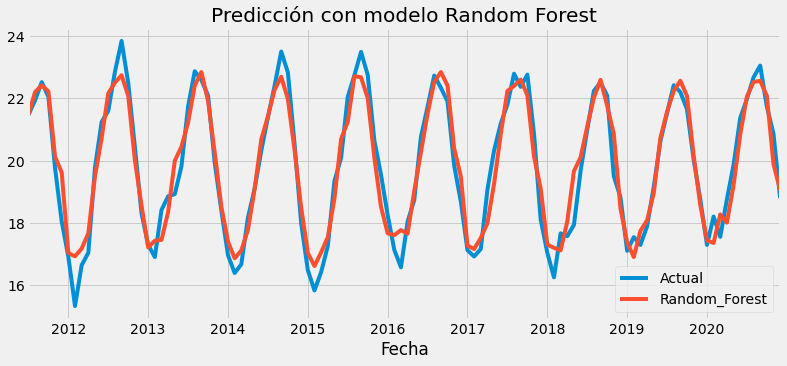

In [157]:
ax = b['Actual'].plot(legend=True,figsize=(12,5),title='Predicción con modelo Random Forest')
b['Random_Forest'].plot(legend=True)
ax.autoscale(axis='x',tight=True)

In [158]:
metricas_T2M = pd.DataFrame({'r2_score': r2_score(y_test,pred),
                        'MAE': mean_absolute_error(y_test,pred),
                        'MSE': mean_squared_error(y_test,pred),
                        'RMSE': mean_squared_error(y_test,pred, squared=False)}, index=[0])
metricas_T2M.head()

,r2_score,MAE,MSE,RMSE
0,0.926635,0.489483,0.358211,0.598507


# Random Forest para Humedad Relativa

In [159]:
rf_RH = dfrf[['RH2M', 'Año', 'Mes']]
rf_RH.head()

,RH2M,Año,Mes
Fecha,,,
1982-01-01,73.19,1982,1
1982-02-01,74.56,1982,2
1982-03-01,78.19,1982,3
1982-04-01,71.44,1982,4
1982-05-01,75.31,1982,5


In [160]:
rf_RH['L1'] = rf_RH['RH2M'].shift(1)
rf_RH['L2'] = rf_RH['RH2M'].shift(2)
rf_RH['L3'] = rf_RH['RH2M'].shift(3)
rf_RH['L4'] = rf_RH['RH2M'].shift(4)
rf_RH['L5'] = rf_RH['RH2M'].shift(5)
rf_RH['L6'] = rf_RH['RH2M'].shift(6)
rf_RH['L7'] = rf_RH['RH2M'].shift(7)
rf_RH['L8'] = rf_RH['RH2M'].shift(8)
rf_RH['L9'] = rf_RH['RH2M'].shift(9)
rf_RH['L10'] = rf_RH['RH2M'].shift(10)
rf_RH['L11'] = rf_RH['RH2M'].shift(11)
rf_RH['L12'] = rf_RH['RH2M'].shift(12)

In [161]:
rf_RH = rf_RH.dropna()

In [162]:
X = rf_RH[['Año', 'Mes','L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'L7', 'L8', 'L9', 'L10', 'L11', 'L12']]
y = rf_RH['RH2M']

In [163]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12345, shuffle=False)

In [164]:
model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)
pred = model_rf.predict(X_test)

In [165]:
b_RH = pd.DataFrame({'Actual': y_test, 'Random_Forest': pred})
b_RH.head()

,Actual,Random_Forest
Fecha,,
2013-05-01,72.00,76.8456
2013-06-01,78.44,80.4852
2013-07-01,81.94,81.5259
2013-08-01,81.75,81.1936
2013-09-01,76.44,78.0649


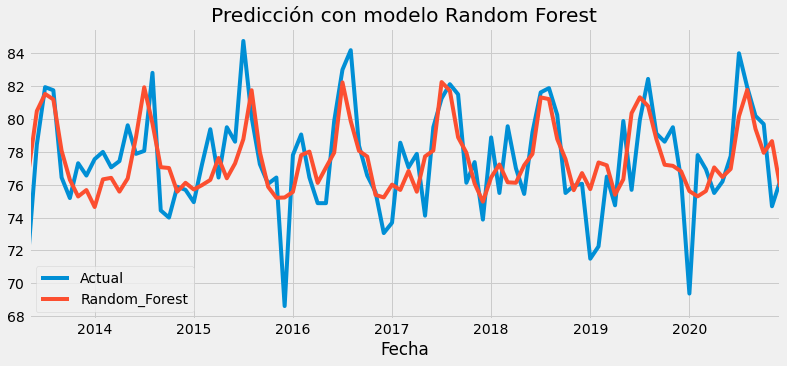

In [166]:
ax = b_RH['Actual'].plot(legend=True,figsize=(12,5),title='Predicción con modelo Random Forest')
b_RH['Random_Forest'].plot(legend=True)
ax.autoscale(axis='x',tight=True)

In [167]:
metricas_RH = pd.DataFrame({'r2_score': r2_score(y_test,pred),
                        'MAE': mean_absolute_error(y_test,pred),
                        'MSE': mean_squared_error(y_test,pred),
                        'RMSE': mean_squared_error(y_test,pred, squared=False)}, index=[0])
metricas_RH.head()

,r2_score,MAE,MSE,RMSE
0,0.402132,1.876,5.600745,2.366589


# Pronóstico de velocidad del viento con Random Forest

In [168]:
rf_WS = dfrf[['WS10M', 'Año', 'Mes']]
rf_WS.head()

,WS10M,Año,Mes
Fecha,,,
1982-01-01,4.70,1982,1
1982-02-01,5.42,1982,2
1982-03-01,7.16,1982,3
1982-04-01,4.20,1982,4
1982-05-01,6.26,1982,5


In [169]:
rf_WS['L1'] = rf_WS['WS10M'].shift(1)
rf_WS['L2'] = rf_WS['WS10M'].shift(2)
rf_WS['L3'] = rf_WS['WS10M'].shift(3)
rf_WS['L4'] = rf_WS['WS10M'].shift(4)
rf_WS['L5'] = rf_WS['WS10M'].shift(5)
rf_WS['L6'] = rf_WS['WS10M'].shift(6)
rf_WS['L7'] = rf_WS['WS10M'].shift(7)
rf_WS['L8'] = rf_WS['WS10M'].shift(8)
rf_WS['L9'] = rf_WS['WS10M'].shift(9)
rf_WS['L10'] = rf_WS['WS10M'].shift(10)
rf_WS['L11'] = rf_WS['WS10M'].shift(11)
rf_WS['L12'] = rf_WS['WS10M'].shift(12)

In [170]:
rf_WS = rf_WS.dropna()

In [171]:
X = rf_WS[['Año', 'Mes','L1', 'L2', 'L3', 'L4', 'L5', 'L6', 'L7', 'L8', 'L9', 'L10', 'L11', 'L12']]
y = rf_WS['WS10M']

In [172]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=12345, shuffle=False)

In [173]:
model_rf = RandomForestRegressor(n_estimators=500, max_depth=8)
model_rf.fit(X_train, y_train)
pred = model_rf.predict(X_test)

In [174]:
b_WS = pd.DataFrame({'Actual': y_test, 'Random_Forest': pred})
b_WS.head()

,Actual,Random_Forest
Fecha,,
2013-05-01,5.49,5.546638
2013-06-01,6.30,5.597588
2013-07-01,5.30,6.770193
2013-08-01,6.06,6.150777
2013-09-01,4.49,4.809816


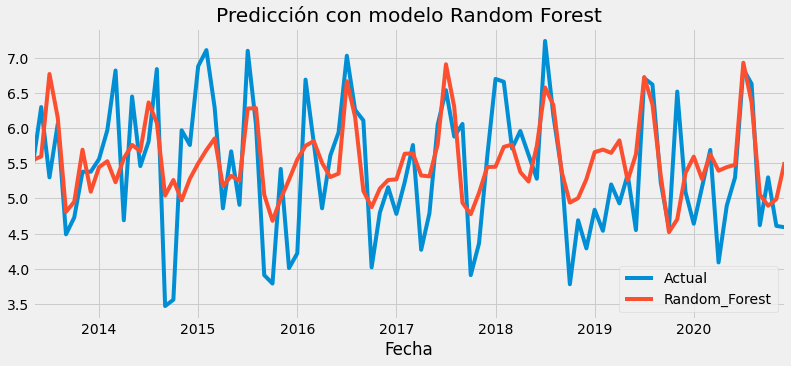

In [175]:
ax = b_WS['Actual'].plot(legend=True,figsize=(12,5),title='Predicción con modelo Random Forest')
b_WS['Random_Forest'].plot(legend=True)
ax.autoscale(axis='x',tight=True)

In [176]:
metricas_WS = pd.DataFrame({'r2_score': r2_score(y_test,pred),
                        'MAE': mean_absolute_error(y_test,pred),
                        'MSE': mean_squared_error(y_test,pred),
                        'RMSE': mean_squared_error(y_test,pred, squared=False)}, index=[0])
metricas_WS.head()

,r2_score,MAE,MSE,RMSE
0,0.338171,0.60042,0.563932,0.750954


# Prediccion de Precipitaciones con Random Forest

In [177]:
rf_precip = dfrf[['PRECTOTCORR', 'Año', 'Mes']]
rf_precip.head()

,PRECTOTCORR,Año,Mes
Fecha,,,
1982-01-01,0.25,1982,1
1982-02-01,0.71,1982,2
1982-03-01,0.12,1982,3
1982-04-01,0.15,1982,4
1982-05-01,0.12,1982,5


In [178]:
rf_precip['L1'] = rf_precip['PRECTOTCORR'].shift(1)
rf_precip['L2'] = rf_precip['PRECTOTCORR'].shift(2)
rf_precip['L3'] = rf_precip['PRECTOTCORR'].shift(3)
rf_precip['L4'] = rf_precip['PRECTOTCORR'].shift(4)
rf_precip['L5'] = rf_precip['PRECTOTCORR'].shift(5)
rf_precip['L6'] = rf_precip['PRECTOTCORR'].shift(6)
rf_precip['L7'] = rf_precip['PRECTOTCORR'].shift(7)
rf_precip['L8'] = rf_precip['PRECTOTCORR'].shift(8)
rf_precip['L9'] = rf_precip['PRECTOTCORR'].shift(9)
rf_precip['L10'] = rf_precip['PRECTOTCORR'].shift(10)
rf_precip['L11'] = rf_precip['PRECTOTCORR'].shift(11)
rf_precip['L12'] = rf_precip['PRECTOTCORR'].shift(12)

In [179]:
rf_precip = rf_precip.dropna()

In [189]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=seed, shuffle=False)

In [190]:
model_rf = RandomForestRegressor()
model_rf.fit(X_train, y_train)
pred = model_rf.predict(X_test)

In [191]:
b_precip = pd.DataFrame({'Actual': y_test, 'Random_Forest': pred})
b_precip.head()

,Actual,Random_Forest
Fecha,,
2013-05-01,5.49,5.5481
2013-06-01,6.30,5.7298
2013-07-01,5.30,6.6915
2013-08-01,6.06,6.2544
2013-09-01,4.49,4.8137


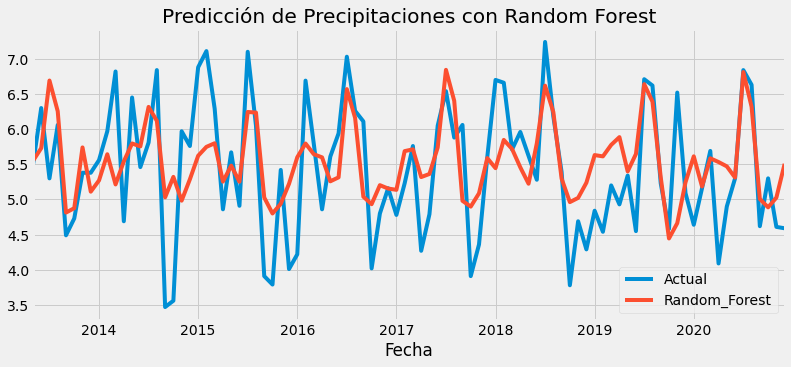

In [192]:
ax = b_precip['Actual'].plot(legend=True,figsize=(12,5),title='Predicción de Precipitaciones con Random Forest')
b_precip['Random_Forest'].plot(legend=True)
ax.autoscale(axis='x',tight=True)

In [193]:
metricas_precip = pd.DataFrame({'r2_score': r2_score(y_test,pred),
                        'MAE': mean_absolute_error(y_test,pred),
                        'MSE': mean_squared_error(y_test,pred),
                        'RMSE': mean_squared_error(y_test,pred, squared=False)}, index=[0])
metricas_precip.head()

,r2_score,MAE,MSE,RMSE
0,0.333694,0.599728,0.567748,0.75349


In [194]:
metricas = pd.concat([metricas_T2M['r2_score'], metricas_RH['r2_score'], metricas_WS['r2_score']
                        ,metricas_precip['r2_score']], axis=1)

In [195]:
metricas.columns = ['r2_temp', 'r2_humidity', 'r2_wind', 'r2_precip']
metricas

,r2_temp,r2_humidity,r2_wind,r2_precip
0,0.926635,0.402132,0.338171,0.333694


In [258]:
validation = pd.concat([metricas, evaluation, validacion], axis=0)
modelo = ['Random Forest', 'ARIMA', 'Prophet']
validation['modelo'] = modelo
validation.index = validation['modelo']
validation

,r2_temp,r2_humidity,r2_wind,r2_precip,modelo
modelo,,,,,
Random Forest,0.926635,0.402132,0.338171,0.333694,Random Forest
ARIMA,0.782272,-14.999522,-0.822270,0.396601,ARIMA
Prophet,0.929817,0.537627,0.381837,0.505316,Prophet
